In [1]:
import os
import sys
import uproot
import json
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats as st
import scipy

import peakutils

from datetime import datetime

import math
from scipy          import stats
from scipy.optimize import curve_fit

from matplotlib.colors import LogNorm

from legendmeta.catalog import Props

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [2]:
### Import functions from peak_functions

repository_path = os.path.abspath('/Users/romoluque_c/Repositories/BACON_romo/')
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
plt.rcParams["figure.figsize"] = 9, 6
plt.rcParams["font.size"]      = 14

In [55]:
fav_col = '#418094'

In [145]:
import re

evts_path = '/Users/romoluque_c/LEGEND/BACON/data_npz/'

trigger_chs = [9, 10, 11]

thr_ADC        = 50
sg_filt_window = 30
min_dist       = 15

def extract_date_and_number(filename):
    match = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    return match.group(1), int(match.group(2))

def adapt_evt_id(evt_id, fnum):
    return 1000000*fnum + np.array(evt_id)

files        = os.listdir(evts_path)
filt_files   = [file for file in files if file.startswith(f"BACoN_hits_and_times_thr{thr_ADC}_w{sg_filt_window}_dist{min_dist}_run-")]
sorted_files = sorted(filt_files, key=extract_date_and_number)

In [12]:
filt_evts_all          = {}
idx_peak_thr_all       = {}
h_peak_sg_d_all        = {}
idx_peak_thr_trigg_all = {}
h_peak_sg_d_trigg_all  = {}

idx_peak_thr_pretrigg_cut       = {}
h_peak_sg_d_pretrigg_cut        = {}
idx_peak_thr_trigg_pretrigg_cut = {}
h_peak_sg_d_trigg_pretrigg_cut  = {}

normal_chs1 = range(9)
normal_chs2 = [0, 1, 2, 3, 4, 6, 7, 8]

for filename in sorted_files:
    my_file    = evts_path+filename
    d          = np.load(my_file, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date.startswith("11"):
        normal_chs = normal_chs1
    else:
        normal_chs = normal_chs2
        
    if date not in filt_evts_all:
        print(date)
        filt_evts_all   [date] = {ch: d['filt_evts_dict'].item()[ch] for ch in normal_chs}
        idx_peak_thr_all[date] = {ch: np.concatenate(d['idx_peaks_thr_ch_dict']         .item()[ch]) for ch in normal_chs}
        h_peak_sg_d_all [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_ch_dict'].item()[ch]) for ch in normal_chs}

        idx_peak_thr_trigg_all[date] = {ch: np.concatenate(d['idx_peaks_thr_ch_trigg_dict']         .item()[ch]) for ch in trigger_chs}
        h_peak_sg_d_trigg_all [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_ch_trigg_dict'].item()[ch]) for ch in trigger_chs}
                
    for ch in normal_chs:
        try:
            filt_evts_all   [date][ch] = np.concatenate((filt_evts_all   [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
            idx_peak_thr_all[date][ch] = np.concatenate((idx_peak_thr_all[date][ch], np.concatenate(d['idx_peaks_thr_ch_dict']         .item()[ch])))
            h_peak_sg_d_all [date][ch] = np.concatenate((h_peak_sg_d_all [date][ch], np.concatenate(d['height_peaks_sg_deconv_ch_dict'].item()[ch])))
        
        except Exception as e:
            print(date, fnum, filename, ch, str(e))
            continue

    for ch in trigger_chs:
        idx_peak_thr_trigg_all[date][ch] = np.concatenate((idx_peak_thr_trigg_all[date][ch], np.concatenate(d['idx_peaks_thr_ch_trigg_dict']         .item()[ch])))
        h_peak_sg_d_trigg_all [date][ch] = np.concatenate((h_peak_sg_d_trigg_all [date][ch], np.concatenate(d['height_peaks_sg_deconv_ch_trigg_dict'].item()[ch])))

01_01_2024
01_02_2024
01_04_2024
01_05_2024
01_07_2024
01_09_2024
01_10_2024
01_12_2024
01_15_2024
01_17_2024
01_18_2024
01_19_2024
01_22_2024
01_23_2024
11_20_2023
11_21_2023
11_21_2023 31 BACoN_hits_and_times_thr50_w30_dist15_run-11_21_2023-file_31.npz 1 need at least one array to concatenate
11_23_2023
11_24_2023
11_25_2023
11_26_2023
11_28_2023
11_29_2023
11_30_2023
12_20_2023


In [15]:
idx_peak_thr_all;

### Import gains

In [182]:
gains = {}

for date in idx_peak_thr_pretrigg_cut.keys():
    try:
        gains[date] =      Props.read_from(f'/Users/romoluque_c/LEGEND/BACON/bacon_data_gains/gains_filt_w30_dist10_{date}.json')
        gains[date].update(Props.read_from(f'/Users/romoluque_c/LEGEND/BACON/bacon_data_gains/gains_trigger_filt_w30_dist10_{date}.json'))
    except Exception as e:
        print(e)
        continue
        
gains['02_06_2024']['7'] = gains['02_03_2024']['7'] ### Bad fitting values for channel 7 in these 2 cases
gains['12_24_2023']['7'] = gains['12_26_2023']['7']
gains['03_12_2024']['7'] = gains['03_18_2024']['7']
gains['03_15_2024']['7'] = gains['03_18_2024']['7']

gains['12_24_2023']['6'] = gains['12_26_2023']['6']
gains['12_24_2023']['8'] = gains['12_26_2023']['8']

[Errno 2] No such file or directory: '/Users/romoluque_c/LEGEND/BACON/bacon_data_gains/gains_filt_w30_dist10_02_16_2024.json'
[Errno 2] No such file or directory: '/Users/romoluque_c/LEGEND/BACON/bacon_data_gains/gains_filt_w30_dist10_02_22_2024.json'
[Errno 2] No such file or directory: '/Users/romoluque_c/LEGEND/BACON/bacon_data_gains/gains_filt_w30_dist10_02_23_2024.json'
[Errno 2] No such file or directory: '/Users/romoluque_c/LEGEND/BACON/bacon_data_gains/gains_filt_w30_dist10_02_24_2024.json'


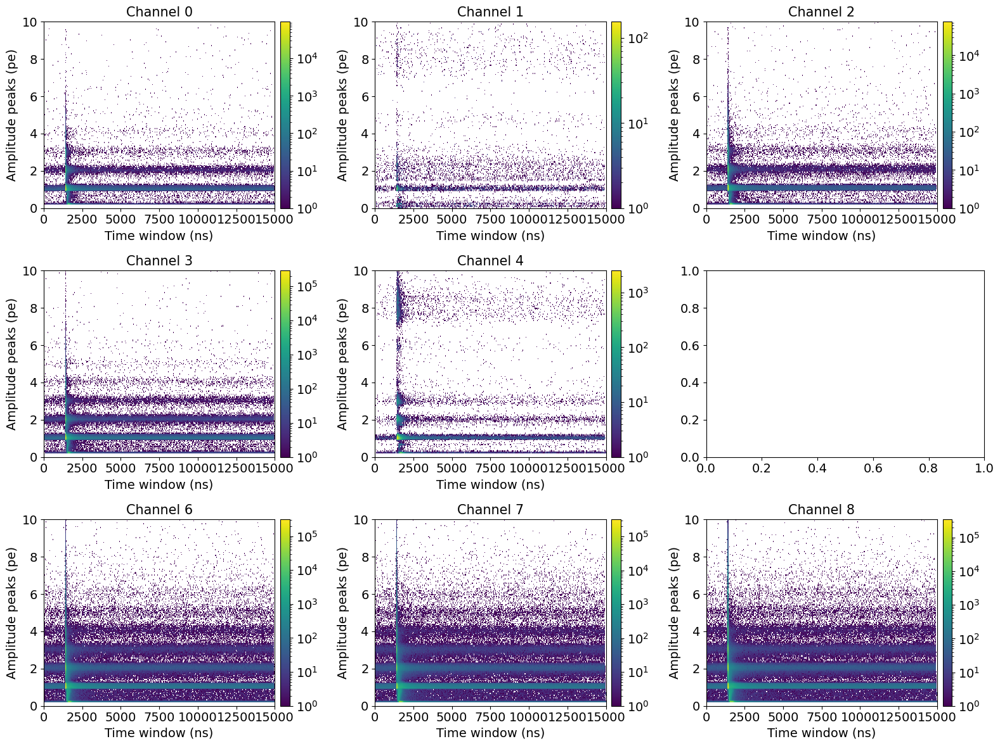

In [21]:
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in normal_chs:
    if k ==5:
        continue
    i = int(k/3)
    j = k%3
    
    ch_idxs = np.concatenate([idx_peak_thr_all[date][k]                     for date in idx_peak_thr_all.keys() if date.startswith('01')])
    ch_vals = np.concatenate([h_peak_sg_d_all [date][k]/gains[date][str(k)] for date in idx_peak_thr_all.keys() if date.startswith('01')])
    
    fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 10)), cmin=1, norm=LogNorm())
    axs[i][j].set_xlabel('Time window (ns)',      fontsize=14)
    axs[i][j].set_ylabel('Amplitude peaks (pe)', fontsize=14)
    axs[i][j].set_title(f"Channel {k}",           fontsize=15)
    fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
plt.tight_layout()
plt.show()

In [93]:
len(sorted_files)

781

In [146]:
idx_peak_thr_pretrigg_cut       = {}
h_peak_sg_d_pretrigg_cut        = {}
num_evts_ch                     = {}
idx_peak_thr_trigg_pretrigg_cut = {}
h_peak_sg_d_trigg_pretrigg_cut  = {}
num_evts_ch_trigg               = {}

normal_chs1 = range(9)
normal_chs2 = [0, 1, 2, 3, 4, 6, 7, 8]

print(len(sorted_files))
for ifile,filename in enumerate(sorted_files):
    if ifile%20==0:
        print(ifile)
    my_file    = evts_path+filename
    d          = np.load(my_file, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date.startswith("11"):
        normal_chs = normal_chs1
    else:
        normal_chs = normal_chs2

    #print(date, fnum)
    for ch in normal_chs:
        idx_peaks_ch_after_cut    = []
        height_peaks_ch_after_cut = []
        num_evts                  = 0
        idx_peaks_ch    = d['idx_peaks_thr_ch_dict']         .item()[ch]
        height_peaks_ch = d['height_peaks_sg_deconv_ch_dict'].item()[ch]
        for idxs, vals in zip(idx_peaks_ch, height_peaks_ch):
            if len(idxs)==0:
                continue
            elif np.any(np.array(idxs) < 650):
                continue
            else:
                idx_peaks_ch_after_cut   .append(idxs)
                height_peaks_ch_after_cut.append(vals)
                num_evts += 1
                
        if date not in idx_peak_thr_pretrigg_cut:
            print(date)
            idx_peak_thr_pretrigg_cut[date] = {}
            h_peak_sg_d_pretrigg_cut [date] = {}
            num_evts_ch              [date] = {}

        if ch not in idx_peak_thr_pretrigg_cut[date]:
            try:
                idx_peak_thr_pretrigg_cut[date][ch] = np.concatenate(idx_peaks_ch_after_cut)
                h_peak_sg_d_pretrigg_cut [date][ch] = np.concatenate(height_peaks_ch_after_cut)
                num_evts_ch              [date][ch] = np.array([num_evts])
            except Exception as e:
                print(e)
                continue
        else:
            try:
                idx_peak_thr_pretrigg_cut[date][ch] = np.concatenate((idx_peak_thr_pretrigg_cut[date][ch], np.concatenate(idx_peaks_ch_after_cut)))
                h_peak_sg_d_pretrigg_cut [date][ch] = np.concatenate((h_peak_sg_d_pretrigg_cut [date][ch], np.concatenate(height_peaks_ch_after_cut)))
                num_evts_ch              [date][ch] = np.concatenate((num_evts_ch              [date][ch], np.array([num_evts])))
            except Exception as e:
                print(e)
                continue
        
        
    for ch in trigger_chs:
        idx_peaks_ch_after_cut    = []
        height_peaks_ch_after_cut = []
        num_evts                  = 0
        idx_peaks_ch    = d['idx_peaks_thr_ch_trigg_dict']         .item()[ch]
        height_peaks_ch = d['height_peaks_sg_deconv_ch_trigg_dict'].item()[ch]
        for idxs, vals in zip(idx_peaks_ch, height_peaks_ch):
            if len(idxs)==0:
                continue
            elif np.any(np.array(idxs) < 650):
                continue
            else:
                idx_peaks_ch_after_cut   .append(idxs)
                height_peaks_ch_after_cut.append(vals)
                num_evts += 1
                
        if date not in idx_peak_thr_trigg_pretrigg_cut:
            idx_peak_thr_trigg_pretrigg_cut[date] = {}
            h_peak_sg_d_trigg_pretrigg_cut [date] = {}
            num_evts_ch_trigg              [date] = {}
    
        if ch not in idx_peak_thr_trigg_pretrigg_cut[date]:
            try:
                idx_peak_thr_trigg_pretrigg_cut[date][ch] = np.concatenate(idx_peaks_ch_after_cut)
                h_peak_sg_d_trigg_pretrigg_cut [date][ch] = np.concatenate(height_peaks_ch_after_cut)
                num_evts_ch_trigg              [date][ch] = np.array([num_evts])
            except Exception as e:
                print(e)
                continue
        else:
            try:
                idx_peak_thr_trigg_pretrigg_cut[date][ch] = np.concatenate((idx_peak_thr_trigg_pretrigg_cut[date][ch], np.concatenate(idx_peaks_ch_after_cut)))
                h_peak_sg_d_trigg_pretrigg_cut [date][ch] = np.concatenate((h_peak_sg_d_trigg_pretrigg_cut [date][ch], np.concatenate(height_peaks_ch_after_cut)))
                num_evts_ch_trigg              [date][ch] = np.concatenate((num_evts_ch_trigg              [date][ch], np.array([num_evts])))
            except Exception as e:
                print(e)
                continue

1818
0
01_01_2024
01_02_2024
20
40
01_04_2024
60
01_05_2024
80
100
01_07_2024
120
01_09_2024
140
01_10_2024
160
01_12_2024
180
01_15_2024
200
01_17_2024
220
01_18_2024
01_19_2024
240
260
01_22_2024
280
01_23_2024
300
01_25_2024
320
340
360
01_29_2024
380
400
420
02_03_2024
440
02_06_2024
460
480
500
520
02_16_2024
02_22_2024
540
02_23_2024
560
580
02_24_2024
600
620
02_26_2024
640
660
02_28_2024
680
02_29_2024
700
720
740
03_02_2024
760
780
03_04_2024
800
03_05_2024
820
840
03_07_2024
860
880
03_09_2024
900
920
940
960
03_12_2024
980
1000
1020
03_15_2024
1040
1060
1080
1100
03_18_2024
03_19_2024
1120
03_20_2024
1140
03_28_2024
1160
04_01_2024
1180
1200
04_04_2024
1220
1240
1260
04_09_2024
1280
1300
1320
1340
1360
04_18_2024
04_22_2024
1380
1400
1420
1440
11_20_2023
1460
1480
11_21_2023
1500
1520
need at least one array to concatenate
11_23_2023
1540
11_24_2023
1560
11_25_2023
1580
11_26_2023
1600
11_28_2023
1620
11_29_2023
11_30_2023
12_20_2023
1640
12_21_2023
12_24_2023
1660
1680
1700

In [147]:
num_evts_ch;

In [148]:
def get_sel_dates(date_strings, idate, fdate):
    cutoff_date1 = datetime(int(idate[6:]), int(idate[:2]), int(idate[3:5]))
    cutoff_date2 = datetime(int(fdate[6:]), int(fdate[:2]), int(fdate[3:5]))
    
    dates         = [datetime.strptime(date_str, '%m_%d_%Y') for date_str in date_strings]
    filt_dates    = [date for date in dates if date <= cutoff_date2 and date >= cutoff_date1]
    filt_date_str = [date.strftime('%m_%d_%Y') for date in sorted(filt_dates)]
    return filt_date_str

dates_no_doping  = get_sel_dates(idx_peak_thr_pretrigg_cut.keys(), '11_19_2023', '01_08_2024')
dates_xe_doping1 = get_sel_dates(idx_peak_thr_pretrigg_cut.keys(), '01_08_2024', '01_25_2024')
dates_xe_doping2 = get_sel_dates(idx_peak_thr_pretrigg_cut.keys(), '01_29_2024', '02_28_2024')
dates_xe_doping3 = get_sel_dates(idx_peak_thr_pretrigg_cut.keys(), '02_29_2024', '03_04_2024')
dates_xe_doping4 = get_sel_dates(idx_peak_thr_pretrigg_cut.keys(), '03_05_2024', '03_12_2024')
dates_xe_doping5 = get_sel_dates(idx_peak_thr_pretrigg_cut.keys(), '03_15_2024', '04_22_2024')

In [167]:
dates_to_remove  = ['02_16_2024', '02_22_2024', '02_23_2024', '02_24_2024']
dates_xe_doping2 = [x for x in dates_xe_doping2 if x not in dates_to_remove]

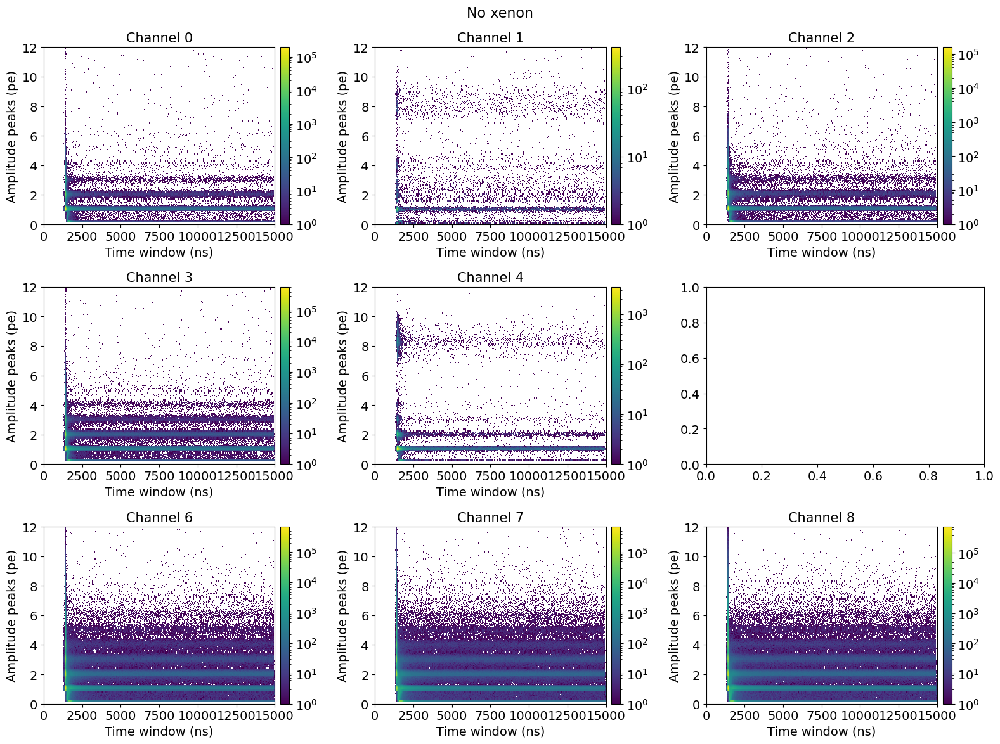

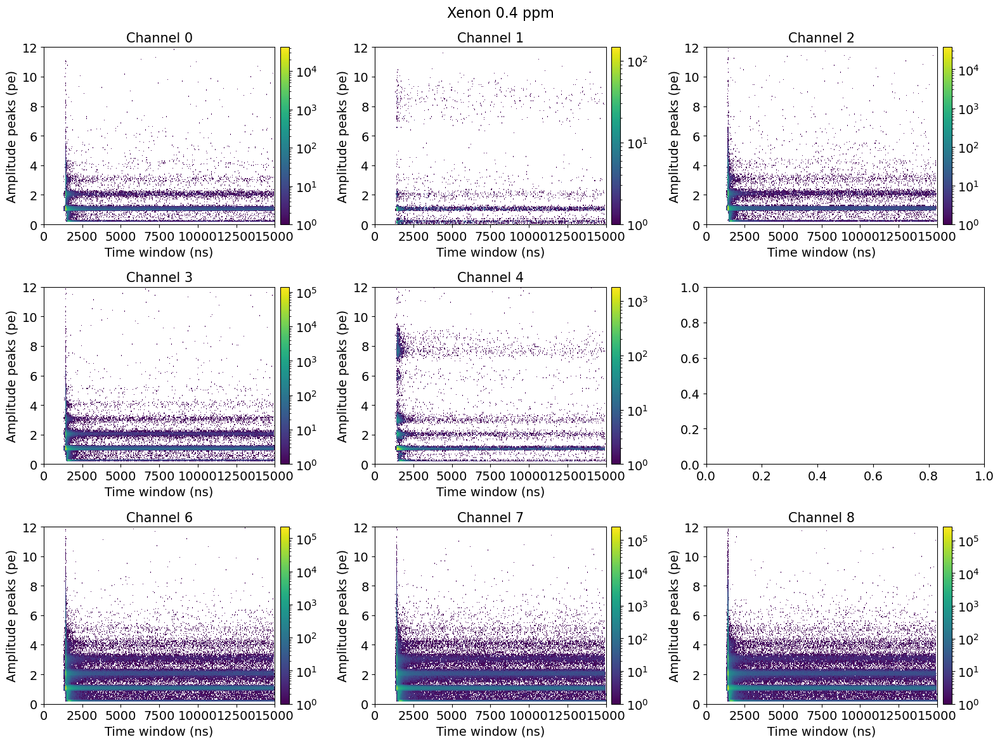

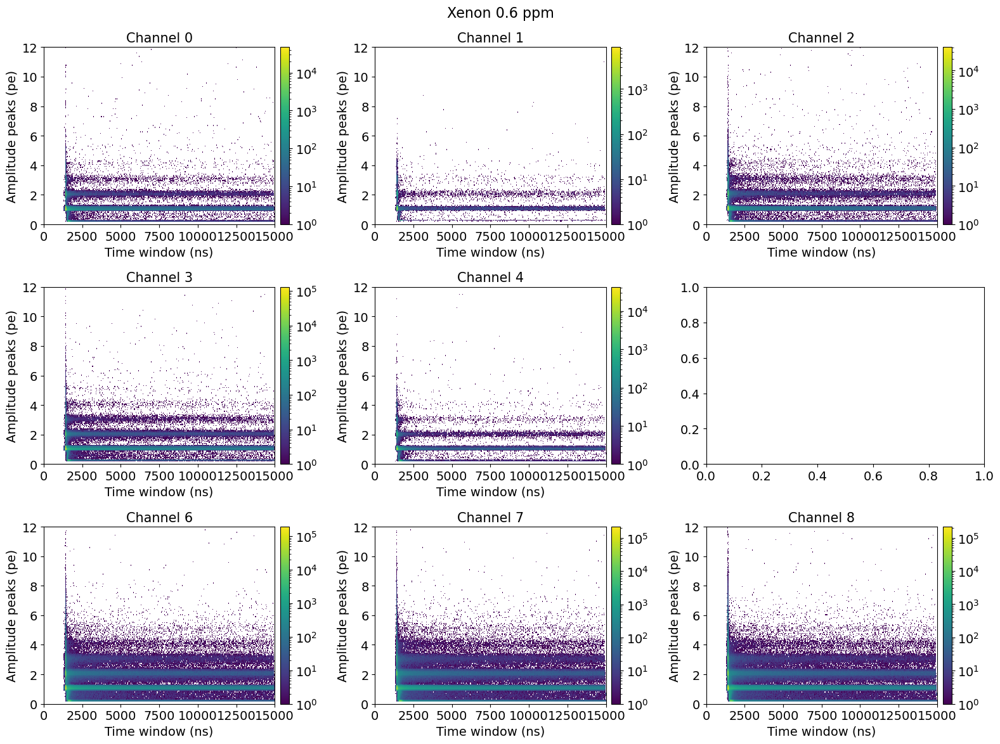

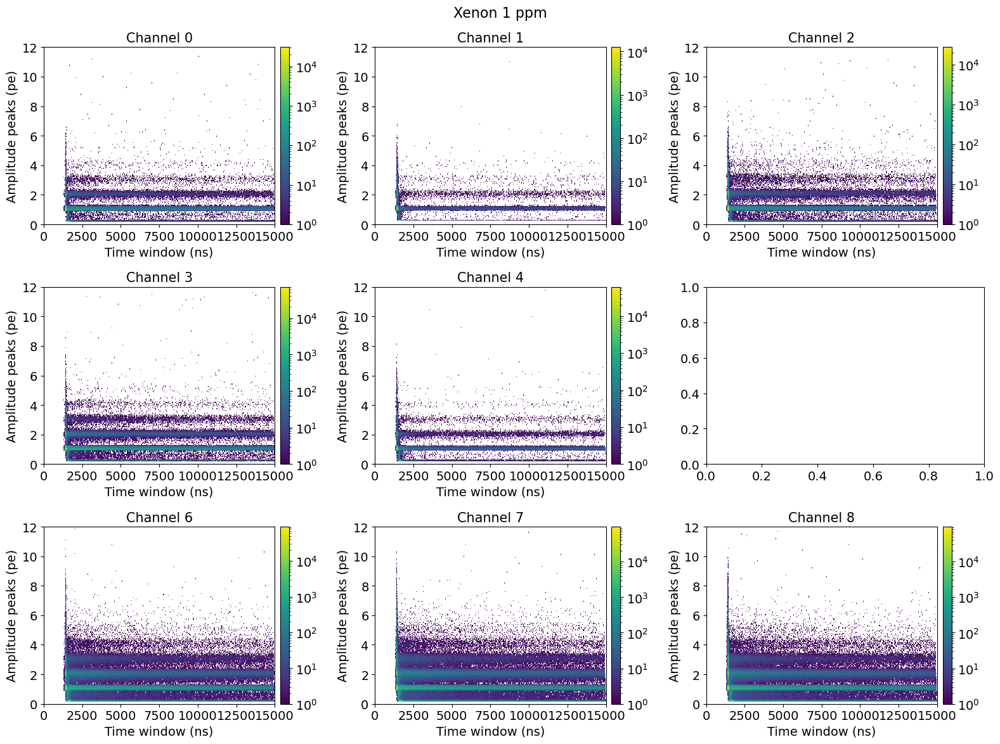

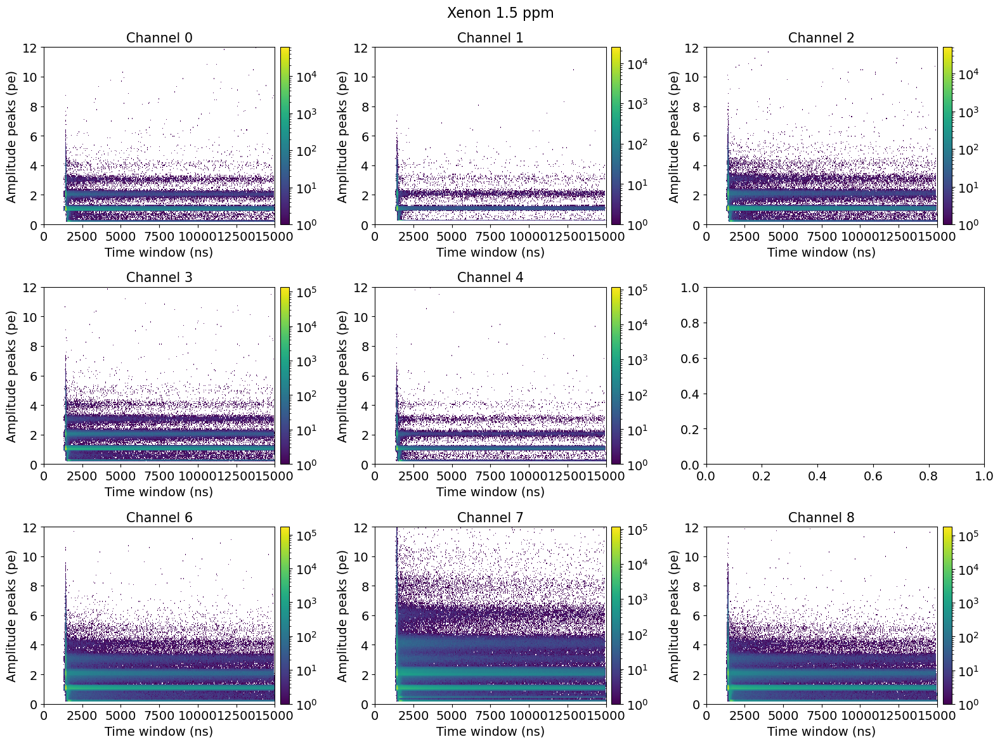

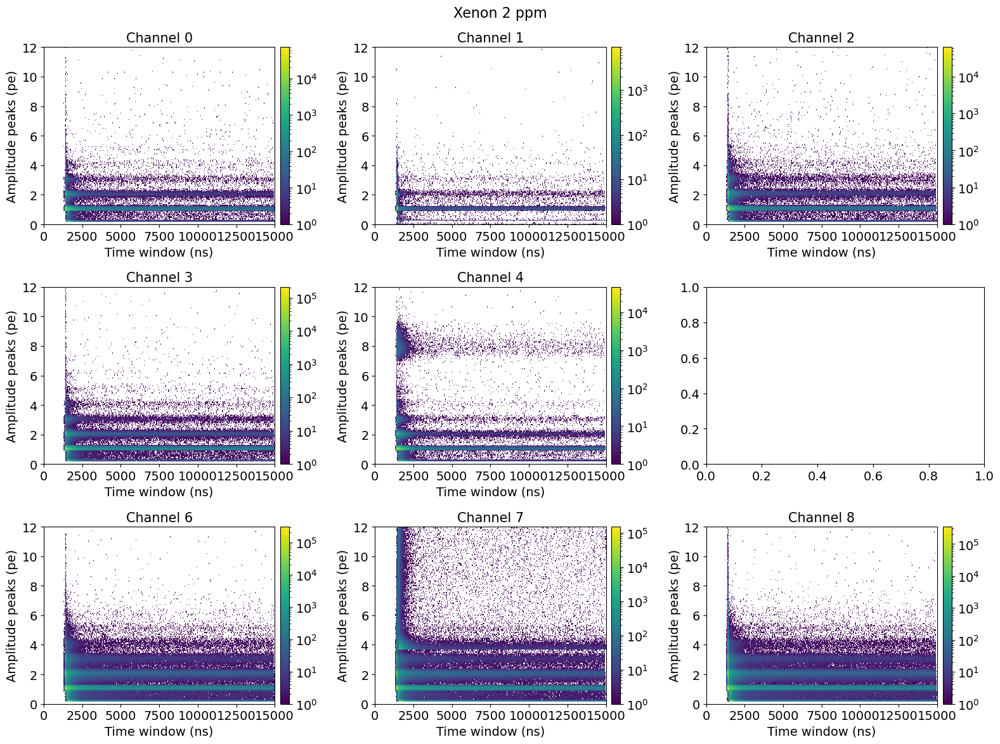

In [187]:
for sel_dates, title in zip([dates_no_doping[1:], dates_xe_doping1, dates_xe_doping2,
                            dates_xe_doping3, dates_xe_doping4, dates_xe_doping5],
                            ['No xenon', 'Xenon 0.4 ppm', 'Xenon 0.6 ppm', 'Xenon 1 ppm', 'Xenon 1.5 ppm',
                             'Xenon 2 ppm']):

    fig, axs = plt.subplots(3, 3, figsize=(16, 12))
    for k in normal_chs:
        if k ==5:
            continue
        i = int(k/3)
        j = k%3
        
        try:
            ch_idxs = np.concatenate([idx_peak_thr_pretrigg_cut[date][k]                     for date in sel_dates])
            ch_vals = np.concatenate([h_peak_sg_d_pretrigg_cut [date][k]/gains[date][str(k)] for date in sel_dates])
        
            fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 12)), cmin=1, norm=LogNorm())
            axs[i][j].set_xlabel('Time window (ns)',     fontsize=14)
            axs[i][j].set_ylabel('Amplitude peaks (pe)', fontsize=14)
            axs[i][j].set_title(f"Channel {k}",          fontsize=15)
            fig.suptitle(title, fontsize=16)
            fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
        except Exception as e:
            print(e)
            continue
    plt.tight_layout()
    plt.show()

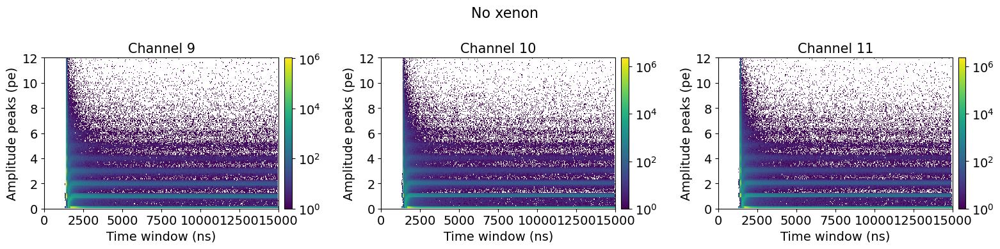

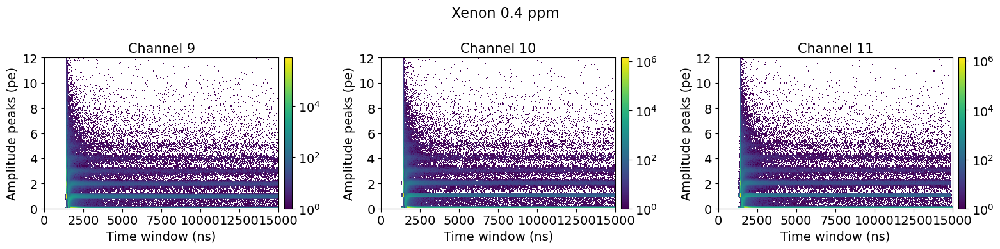

'02_16_2024'
'02_16_2024'
'02_16_2024'


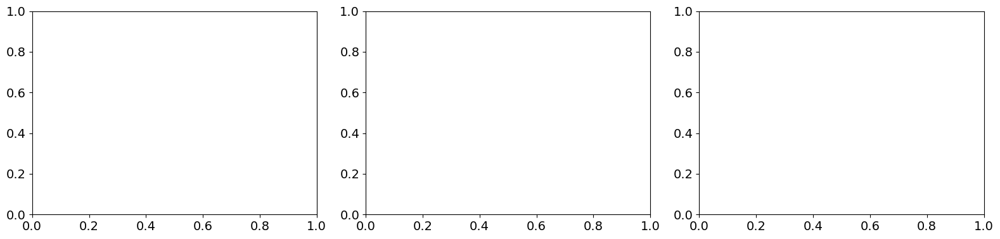

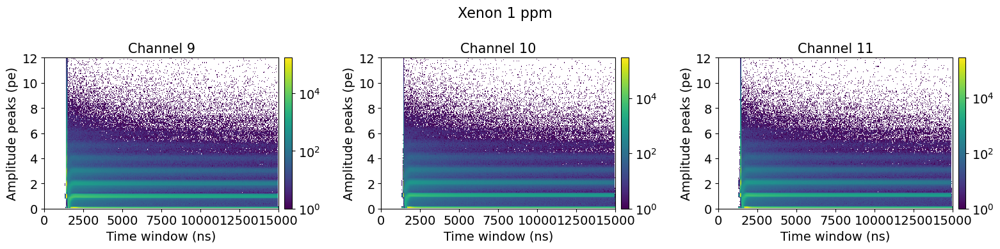

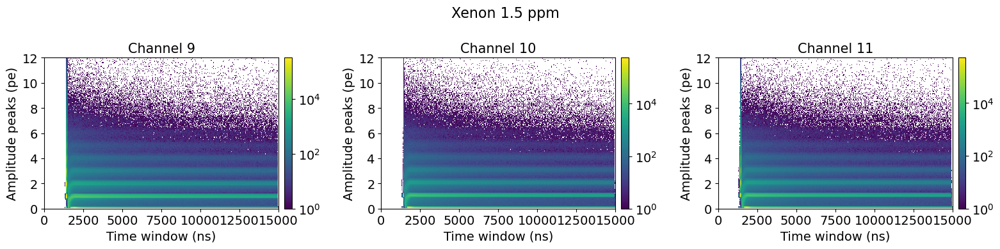

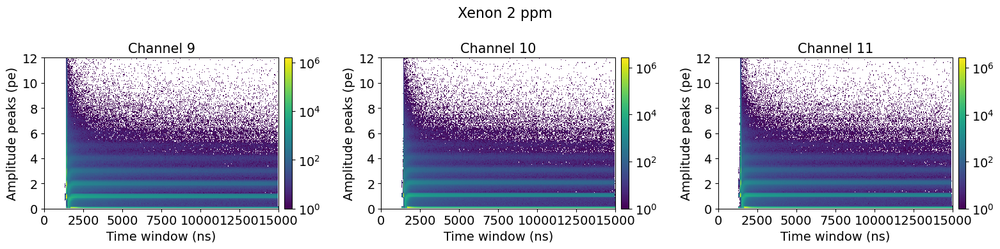

In [154]:
for sel_dates, title in zip([dates_no_doping[1:], dates_xe_doping1, dates_xe_doping2,
                            dates_xe_doping3, dates_xe_doping4, dates_xe_doping5],
                            ['No xenon', 'Xenon 0.4 ppm', 'Xenon 0.6 ppm', 'Xenon 1 ppm', 'Xenon 1.5 ppm',
                             'Xenon 2 ppm']):

    fig, axs = plt.subplots(1, 3, figsize=(16, 4))
    for i,k in enumerate(trigger_chs):
        try:
            ch_idxs = np.concatenate([idx_peak_thr_trigg_pretrigg_cut[date][k]                     for date in sel_dates])
            ch_vals = np.concatenate([h_peak_sg_d_trigg_pretrigg_cut [date][k]/gains[date][str(k)] for date in sel_dates])
            
            fig0 = axs[i].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 12)), cmin=1, norm=LogNorm())
            axs[i].set_xlabel('Time window (ns)',     fontsize=14)
            axs[i].set_ylabel('Amplitude peaks (pe)', fontsize=14)
            axs[i].set_title(f"Channel {k}",          fontsize=15)
            fig.suptitle(title, fontsize=16)
            fig.colorbar(fig0[3], ax=axs[i], pad=0.02)
        except Exception as e:
            print(e)
            continue
    plt.tight_layout()
    plt.show()

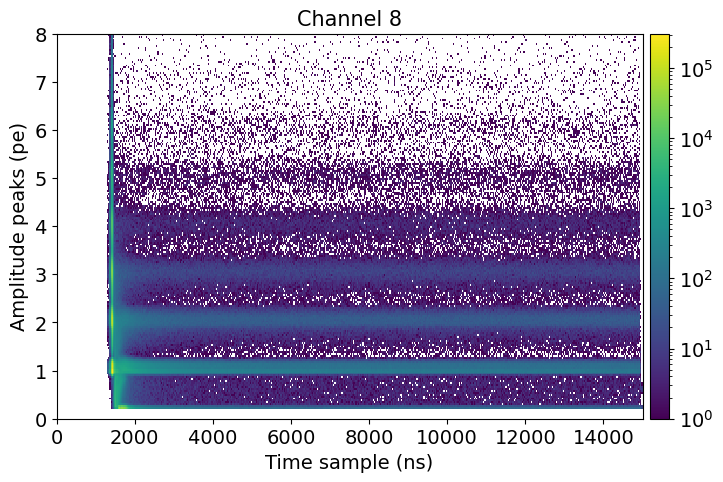

In [71]:
for k in normal_chs:
    if k !=8:
        continue
    i = int(k/3)
    j = k%3
    
    ch_idxs = np.concatenate([idx_peak_thr_pretrigg_cut[date][k]                     for date in dates_no_doping[1:]])
    ch_vals = np.concatenate([h_peak_sg_d_pretrigg_cut [date][k]/gains[date][str(k)] for date in dates_no_doping[1:]])
    
    plt.figure(figsize=(9, 5))
    plt.hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 8)), cmin=1, norm=LogNorm())
    plt.xlabel('Time sample (ns)',     fontsize=14)
    plt.ylabel('Amplitude peaks (pe)', fontsize=14)
    plt.title(f"Channel {k}",          fontsize=15)
    plt.colorbar(pad=0.01)
    if k==8:
        plt.savefig(f'/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation/images/hit_map_ch{k}.png', dpi=300, bbox_inches='tight')
    plt.show()

In [157]:
gains

{'01_01_2024': {'0': 223.616826137732,
  '1': 217.40947540763955,
  '2': 219.43700134814466,
  '3': 210.93343610207808,
  '4': 26.75319832805253,
  '5': 0,
  '6': 224.04900342513457,
  '7': 230.6674836791706,
  '8': 223.11965745942956,
  '9': 627.9556533236998,
  '10': 615.8523505558545,
  '11': 577.5957269359778},
 '01_02_2024': {'0': 224.0726105225874,
  '1': 89.93372300222526,
  '2': 216.72909754946028,
  '3': 211.454537765729,
  '4': 222.04726201327284,
  '5': 0,
  '6': 224.31683375736844,
  '7': 231.15596448020193,
  '8': 223.2216169117848,
  '9': 633.6615391673329,
  '10': 615.7554960833453,
  '11': 576.7822219128236},
 '01_04_2024': {'0': 227.58909339269454,
  '1': 27.19773266199519,
  '2': 217.35880668233963,
  '3': 210.931390920052,
  '4': 225.47622024864313,
  '5': 0,
  '6': 223.77752621058798,
  '7': 230.65866059142894,
  '8': 223.08422628654006,
  '9': 634.9396922565951,
  '10': 615.9989907606691,
  '11': 577.9366990195092},
 '01_05_2024': {'0': 224.33980472614445,
  '1': 2

224.15932866718572
221.4706814713474
217.03239174989577
211.321221080111
222.864224121108
224.25434138323044
233.54646230239655
223.1822173894011


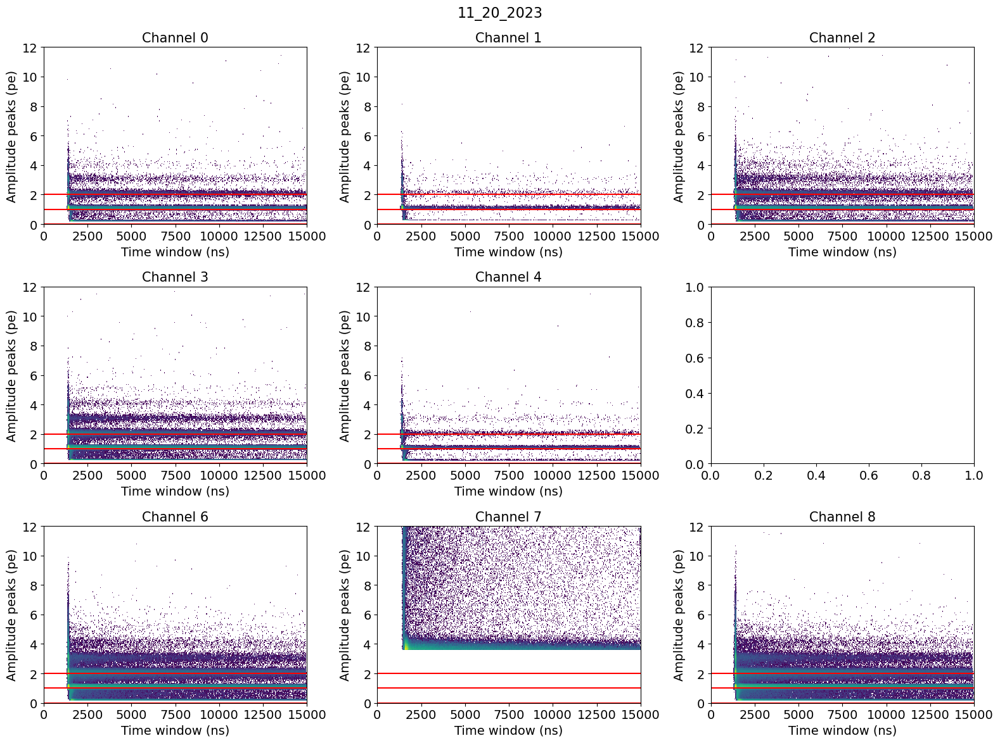

224.15932866718572
221.4706814713474
217.03239174989577
211.321221080111
222.864224121108
224.25434138323044
233.54646230239655
223.1822173894011


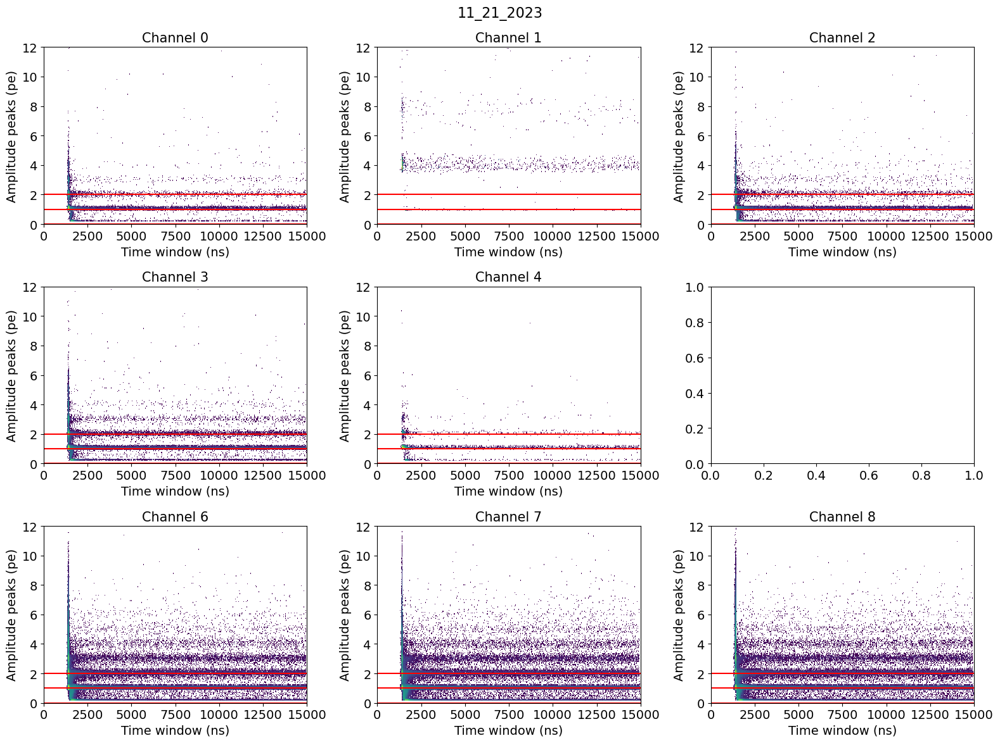

224.15932866718572
221.4706814713474
217.03239174989577
211.321221080111
222.864224121108
224.25434138323044
233.54646230239655
223.1822173894011


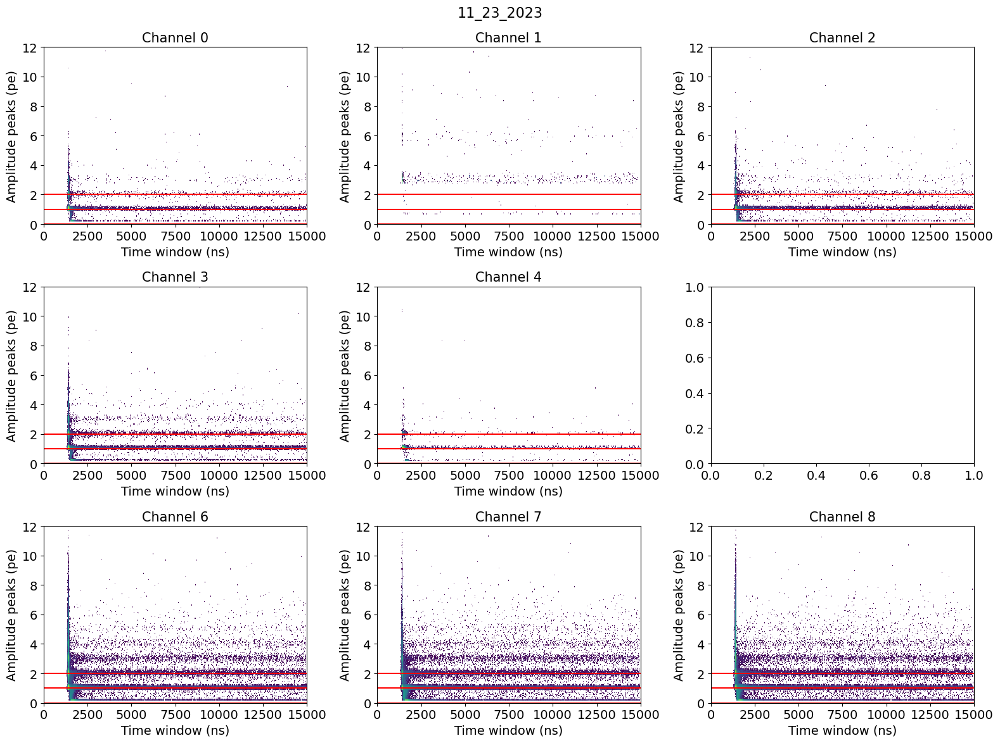

224.15932866718572
221.4706814713474
217.03239174989577
211.321221080111
222.864224121108
224.25434138323044
233.54646230239655
223.1822173894011


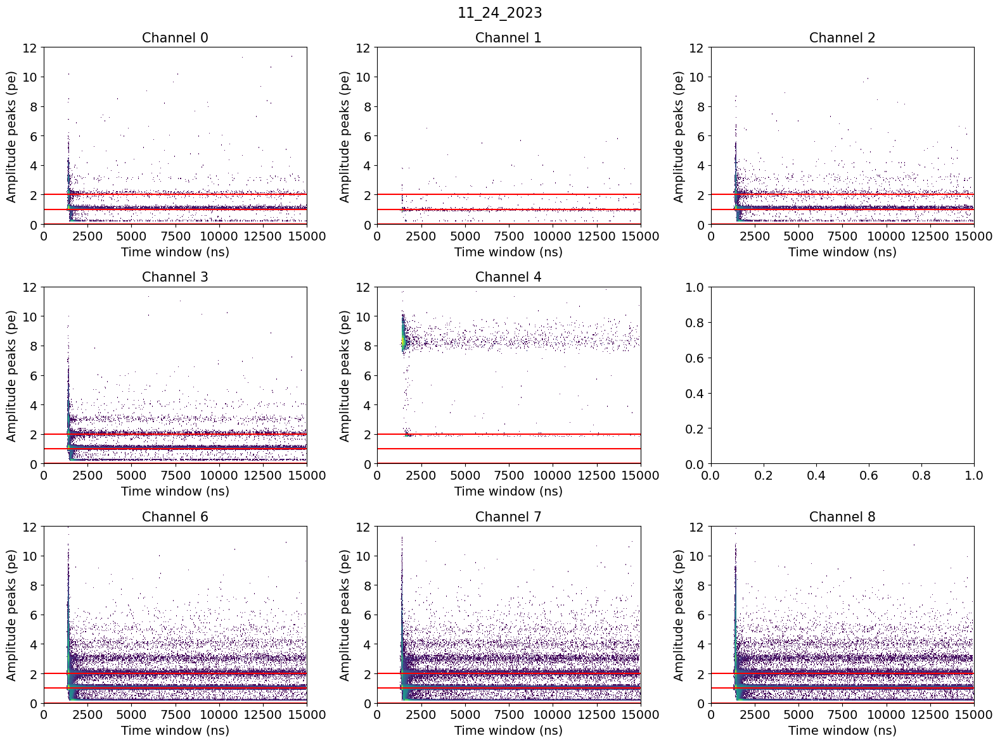

224.15932866718572
221.4706814713474
217.03239174989577
211.321221080111
222.864224121108
224.25434138323044
233.54646230239655
223.1822173894011


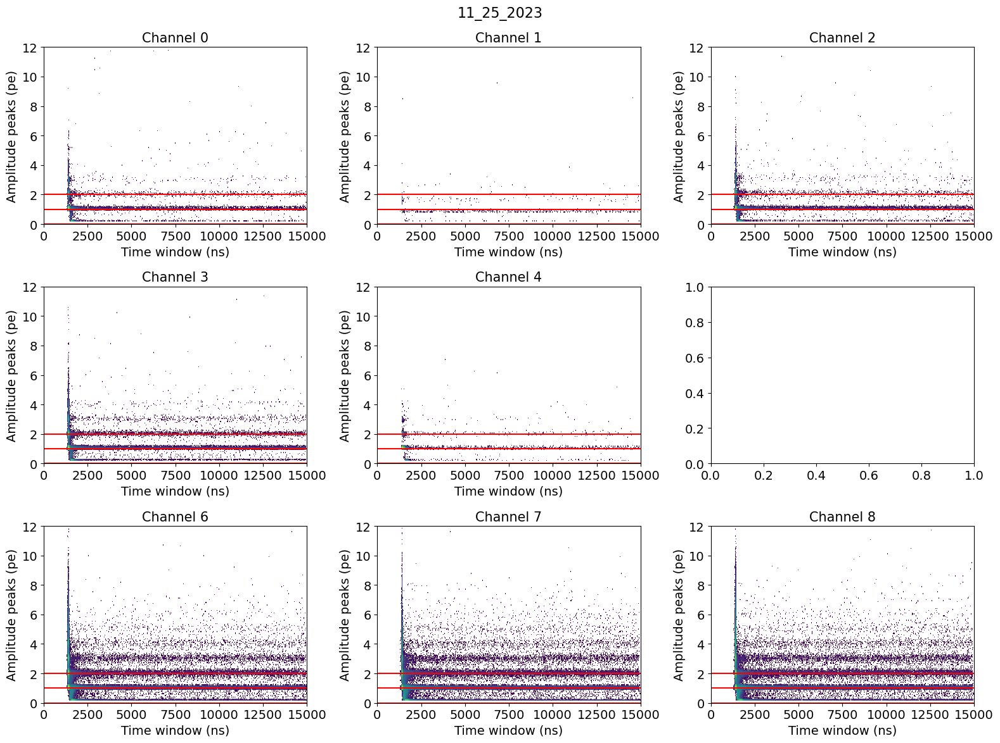

224.15932866718572
221.4706814713474
217.03239174989577
211.321221080111
222.864224121108
224.25434138323044
233.54646230239655
223.1822173894011


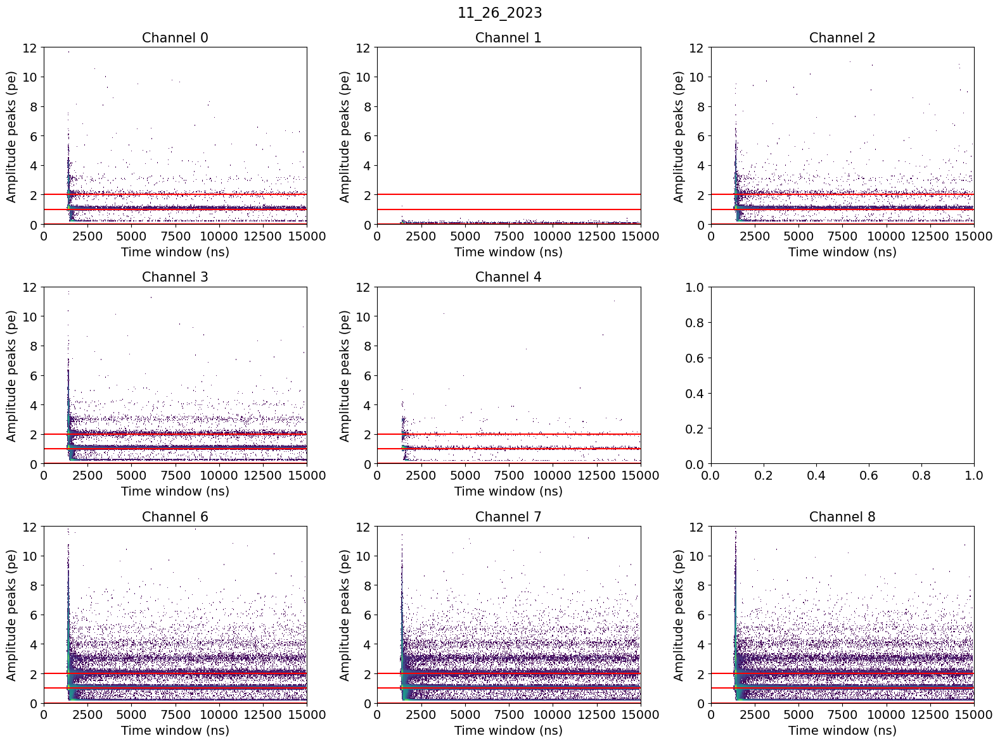

224.15932866718572
221.4706814713474
217.03239174989577
211.321221080111
222.864224121108
224.25434138323044
233.54646230239655
223.1822173894011


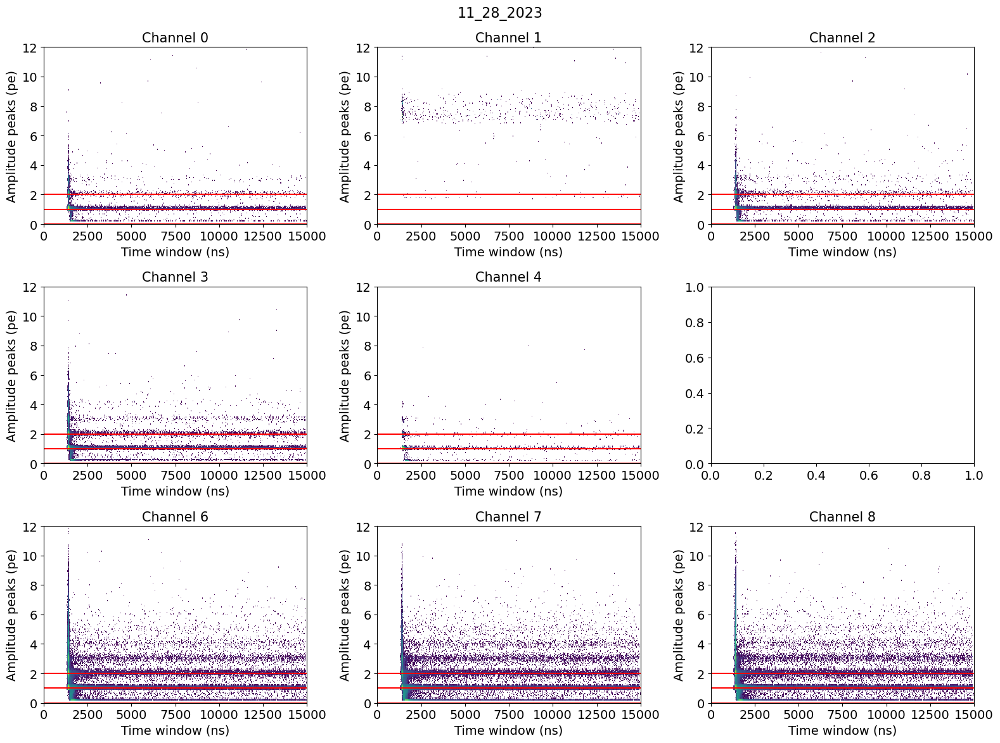

224.15932866718572
221.4706814713474
217.03239174989577
211.321221080111
222.864224121108
224.25434138323044
233.54646230239655
223.1822173894011


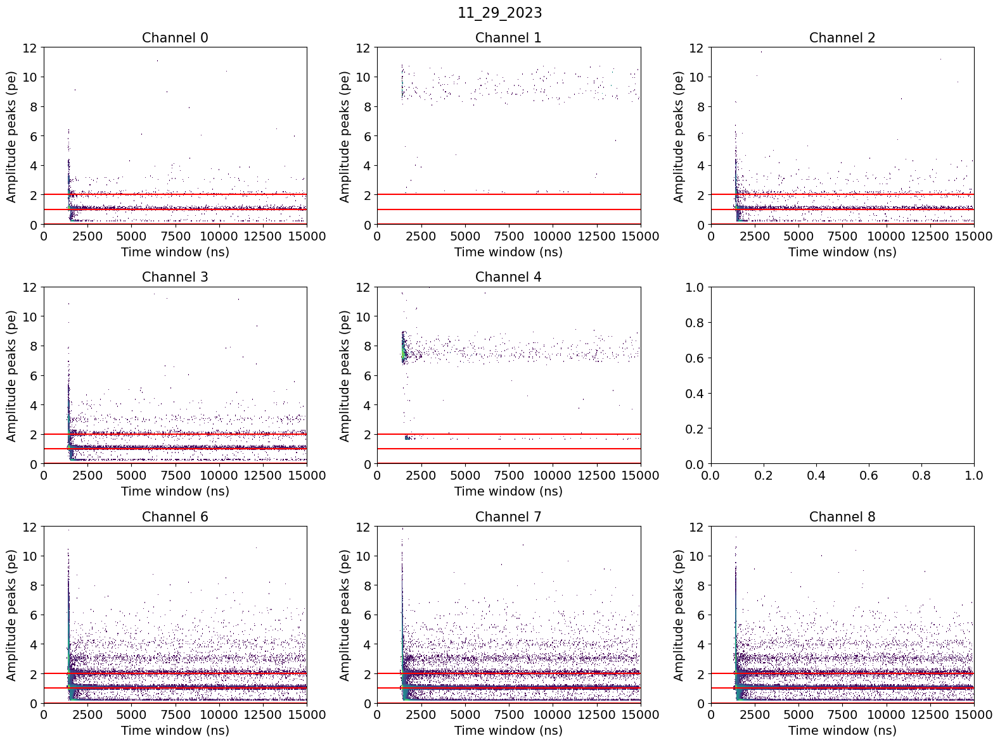

224.15932866718572
221.4706814713474
217.03239174989577
211.321221080111
222.864224121108
224.25434138323044
233.54646230239655
223.1822173894011


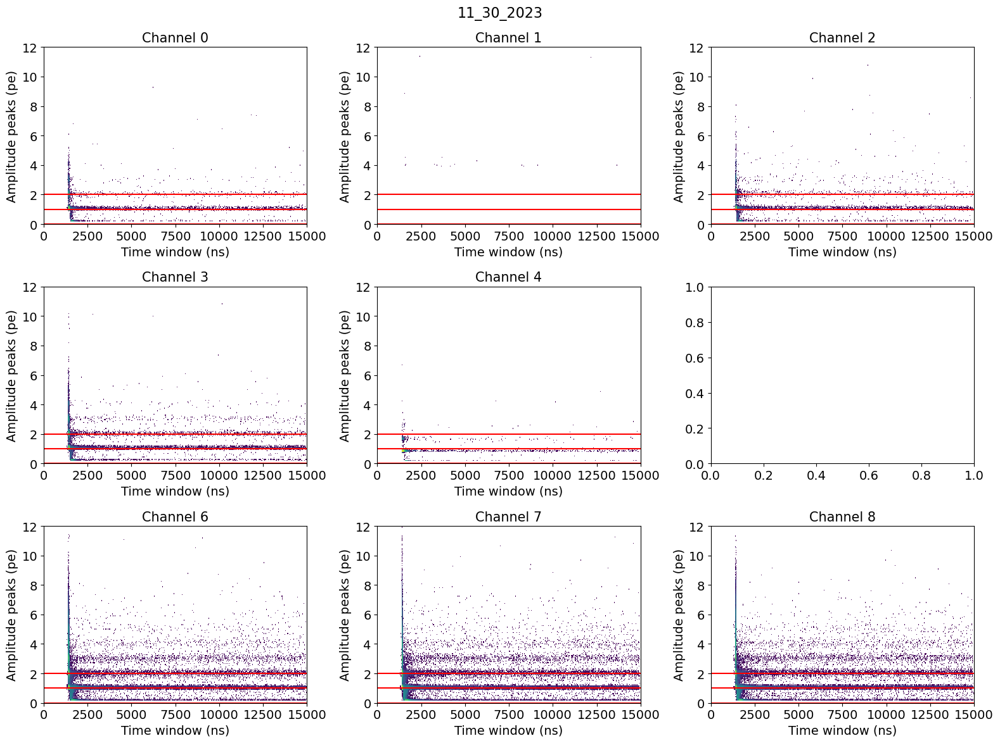

In [186]:
for sel_date in idx_peak_thr_pretrigg_cut.keys():
    if sel_date == '02_16_2024' or sel_date=='02_22_2024' or sel_date=='02_23_2024' or sel_date=='02_24_2024':
        continue
    if sel_date.startswith('11'):
        fig, axs = plt.subplots(3, 3, figsize=(16, 12))
        for k in normal_chs:
            if k ==5:
                continue
            i = int(k/3)
            j = k%3
            print(gains[date][str(k)])
            ch_idxs = np.concatenate([idx_peak_thr_pretrigg_cut[date][k]                     for date in [sel_date]])
            ch_vals = np.concatenate([h_peak_sg_d_pretrigg_cut [date][k]/gains[date][str(k)] for date in [sel_date]])
            
            fig0 = axs[i][j].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 12)), cmin=1, norm=LogNorm())
            for num in range(3):
                axs[i][j].axhline(y=num, c='r')
            axs[i][j].set_xlabel('Time window (ns)',     fontsize=14)
            axs[i][j].set_ylabel('Amplitude peaks (pe)', fontsize=14)
            axs[i][j].set_title(f"Channel {k}",          fontsize=15)
            #fig.colorbar(fig0[3], ax=axs[i][j], pad=0.02)
            fig.suptitle(sel_date, fontsize=16)
            #except Exception as e:
            #    print(e)
            #    continue
        plt.tight_layout()
        plt.show()

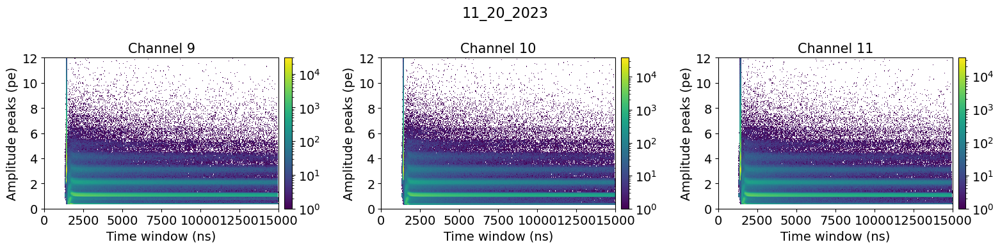

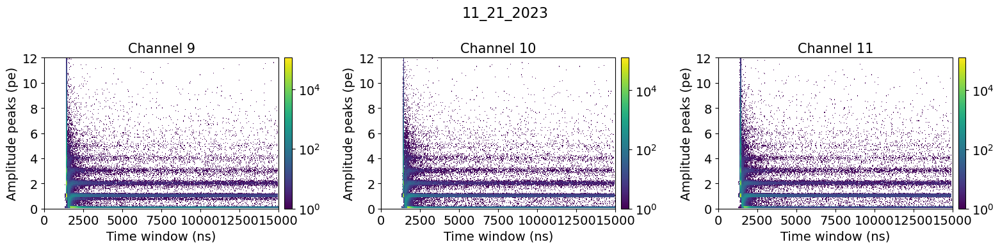

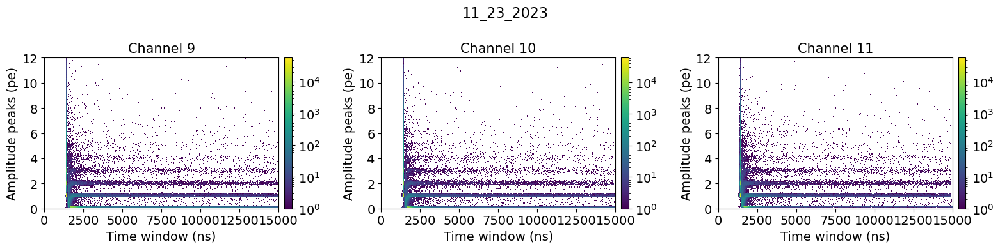

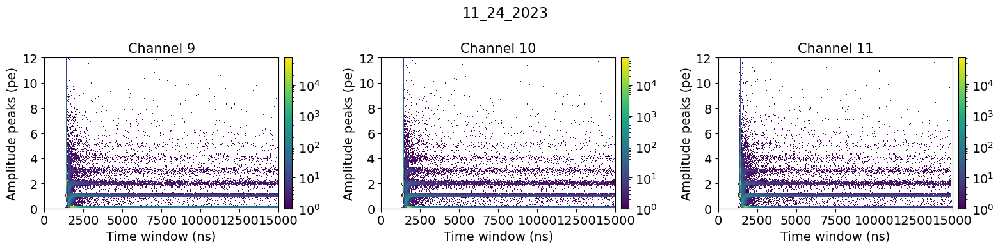

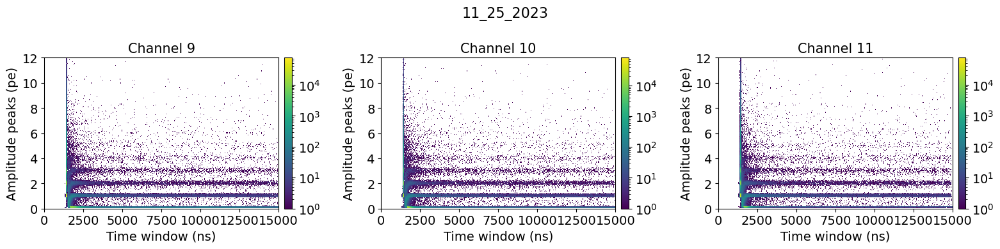

...

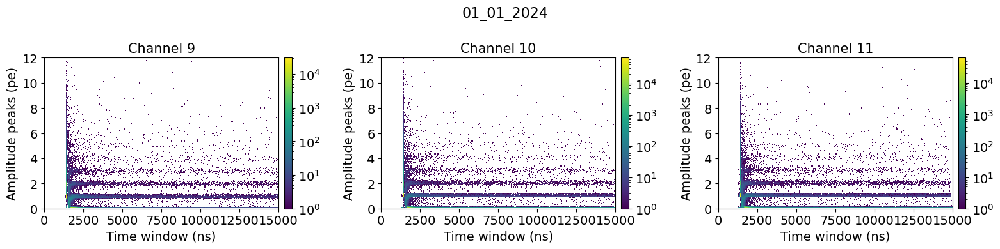

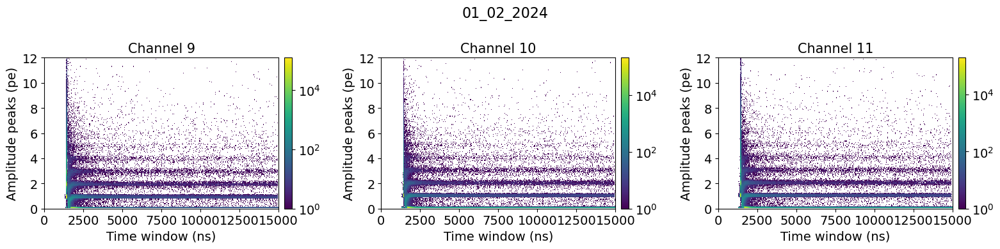

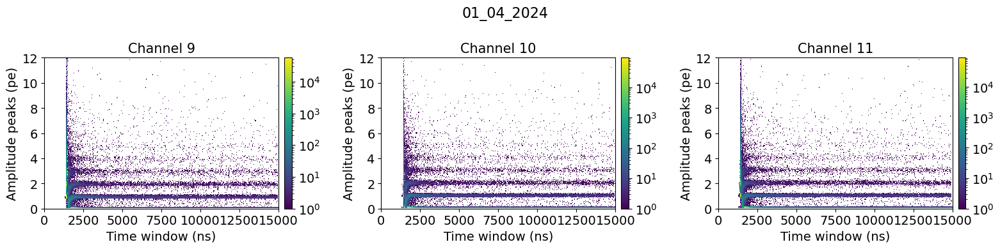

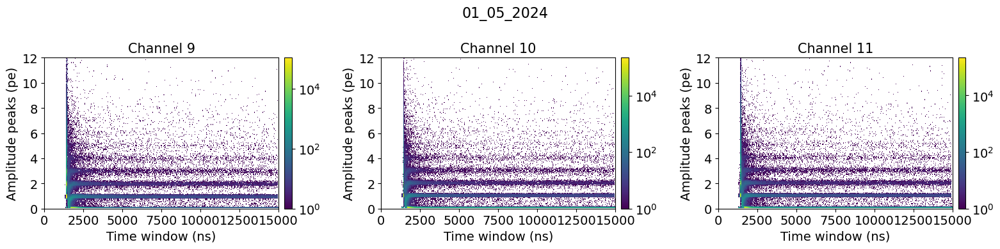

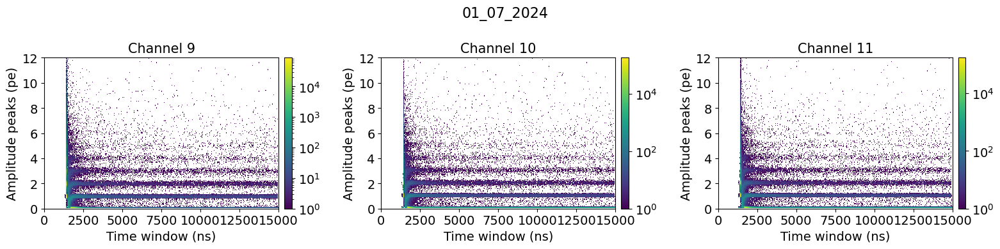

In [82]:
for sel_date in dates_no_doping:
    fig, axs = plt.subplots(1, 3, figsize=(16, 4))
    for i,k in enumerate(trigger_chs):
        
        ch_idxs = np.concatenate([idx_peak_thr_trigg_pretrigg_cut[date][k]                     for date in [sel_date]])
        ch_vals = np.concatenate([h_peak_sg_d_trigg_pretrigg_cut [date][k]/gains[date][str(k)] for date in [sel_date]])
        
        fig0 = axs[i].hist2d(ch_idxs*2, ch_vals, bins=(500, 200), range=((0, 15000), (0, 12)), cmin=1, norm=LogNorm())
        axs[i].set_xlabel('Time window (ns)',     fontsize=14)
        axs[i].set_ylabel('Amplitude peaks (pe)', fontsize=14)
        axs[i].set_title(f"Channel {k}",          fontsize=15)
        fig.colorbar(fig0[3], ax=axs[i], pad=0.02)
        fig.suptitle(sel_date, fontsize=16)
    plt.tight_layout()
    plt.show()

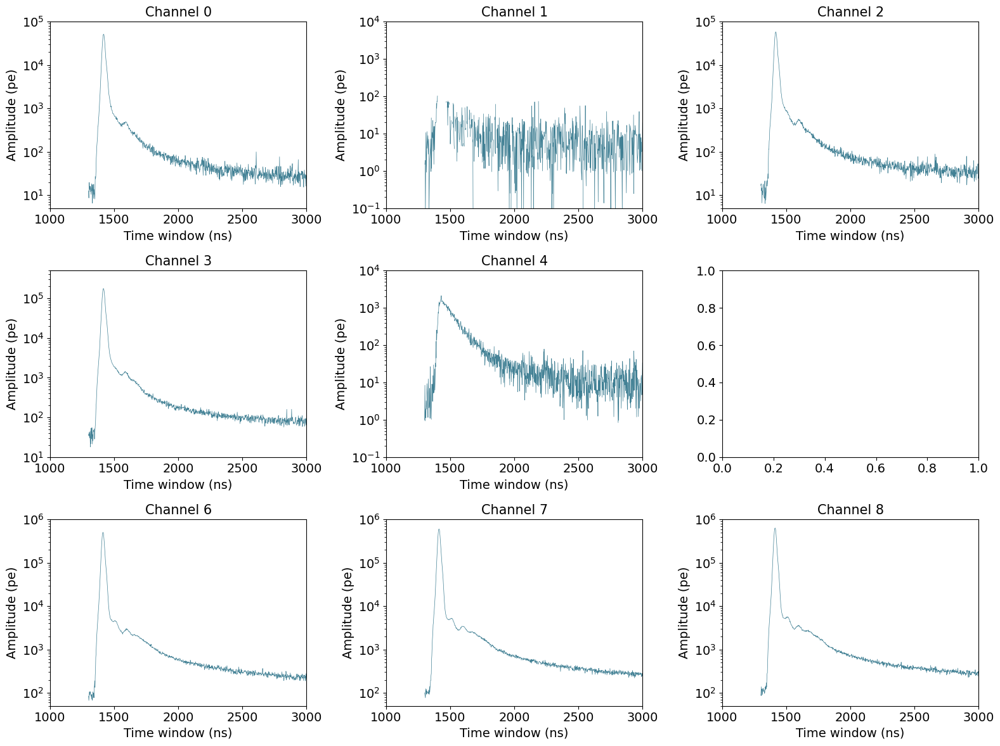

In [66]:
fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in normal_chs:
    if k ==5:
        continue
    i = int(k/3)
    j = k%3
    
    timestamps = 2*np.concatenate([idx_peak_thr_pretrigg_cut[date][k]                     for date in dates_no_doping[1:]])
    amplitudes =   np.concatenate([h_peak_sg_d_pretrigg_cut [date][k]/gains[date][str(k)] for date in dates_no_doping[1:]])
    
    unique_timestamps = np.unique(timestamps)
    sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]

    axs[i][j].plot(unique_timestamps, sum_amplitudes, lw=0.5, label='Hit map', color=fav_col)
    axs[i][j].set_xlabel('Time window (ns)', fontsize=14)
    axs[i][j].set_ylabel('Amplitude (pe)',   fontsize=14)
    axs[i][j].set_title(f"Channel {k}",      fontsize=15)
    axs[i][j].set_yscale('log')
    axs[i][j].set_xlim(1000, 3000)
    if k in [1, 4]:
        axs[i][j].set_ylim(1e-1, 1e4)
    elif k in [6, 7, 8]:
        axs[i][j].set_ylim(5e1, 1e6)
    elif k in [0, 2]:
        axs[i][j].set_ylim(5e0, 1e5)
    else:
        axs[i][j].set_ylim(1e1, 5e5)
plt.tight_layout()
plt.show()

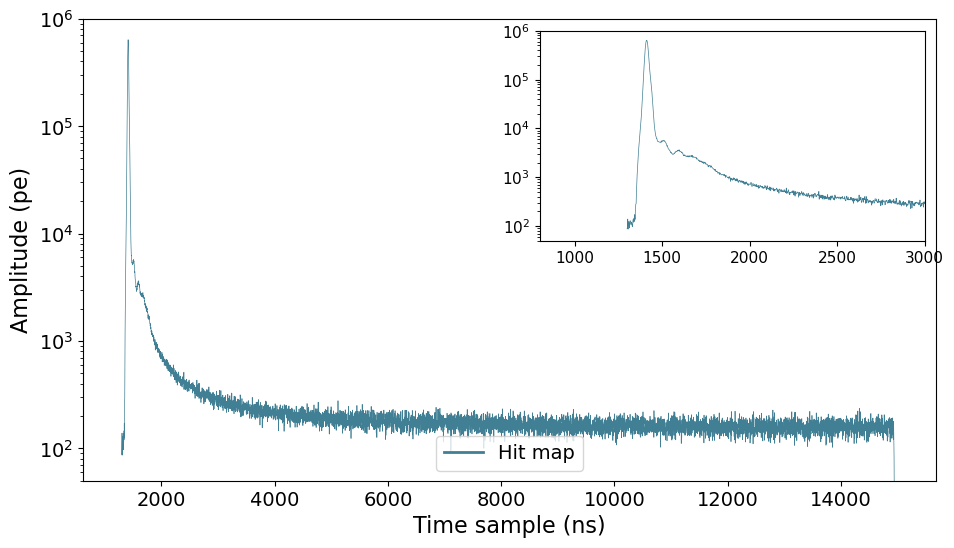

In [77]:
for k in normal_chs:
    if k !=8:
        continue
    i = int(k/3)
    j = k%3
    
    timestamps = 2*np.concatenate([idx_peak_thr_pretrigg_cut[date][k]                     for date in dates_no_doping[1:]])
    amplitudes =   np.concatenate([h_peak_sg_d_pretrigg_cut [date][k]/gains[date][str(k)] for date in dates_no_doping[1:]])
    
    unique_timestamps = np.unique(timestamps)
    sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]

    fig = plt.figure(figsize=(11, 6))
    plt.plot(unique_timestamps, sum_amplitudes, lw=0.5, label='Hit map', color=fav_col)
    plt.xlabel('Time sample (ns)', fontsize=16)
    plt.ylabel('Amplitude (pe)',  fontsize=16)
    plt.ylim(5e1, 1e6)
    plt.yscale('log')
    leg = plt.legend(loc='lower center')
    for line in leg.get_lines():
        line.set_linewidth(2)
    
    ax_inset = fig.add_axes([0.54, 0.51, 0.35, 0.35])
    ax_inset.plot(unique_timestamps, sum_amplitudes, lw=0.5, label='Hit map', color=fav_col)
    ax_inset.set_xlim(800, 3000)
    ax_inset.set_ylim(5e1, 1e6)
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    ax_inset.set_yscale('log')
    
    #plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation/images/hit_map_plot_ch{k}.png', dpi=300, bbox_inches='tight')
    plt.show()

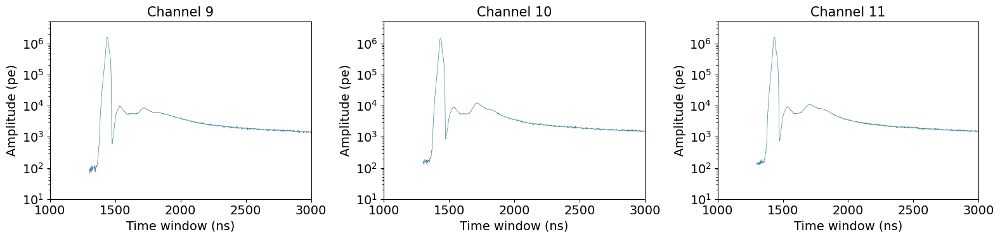

In [118]:
fig, axs = plt.subplots(1, 3, figsize=(16, 4))
for i,k in enumerate(trigger_chs):
    
    timestamps = 2*np.concatenate([idx_peak_thr_trigg_pretrigg_cut[date][k]                     for date in dates_no_doping])
    amplitudes =   np.concatenate([h_peak_sg_d_trigg_pretrigg_cut [date][k]/gains[date][str(k)] for date in dates_no_doping])
    
    unique_timestamps = np.unique(timestamps)
    sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]

    axs[i].plot(unique_timestamps, sum_amplitudes, lw=0.5, label='Hit map', color=fav_col)
    axs[i].set_xlabel('Time window (ns)', fontsize=14)
    axs[i].set_ylabel('Amplitude (pe)',   fontsize=14)
    axs[i].set_title(f"Channel {k}",      fontsize=15)
    axs[i].set_yscale('log')
    axs[i].set_xlim(1000, 3000)
    axs[i].set_ylim(1e1, 5e6)
plt.tight_layout()
plt.show()

### Compare different xenon amounts:

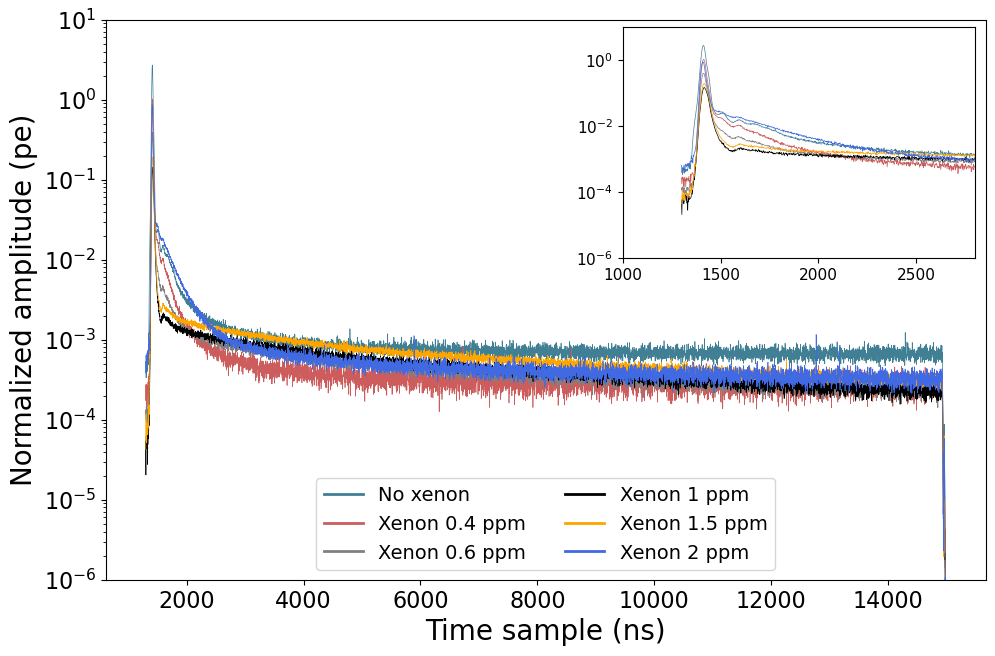

In [198]:
k = 8 ## Channel

fig = plt.figure(figsize=(11, 7))
ax_main  = fig.add_axes([0.1, 0.1, 0.8, 0.8])  # Main plot axes
ax_inset = fig.add_axes([0.57, 0.56, 0.32, 0.33])  # Inset plot axes

for sel_dates, title, col in zip([dates_no_doping[1:], dates_xe_doping1, dates_xe_doping2,
                                  dates_xe_doping3, dates_xe_doping4, dates_xe_doping5],
                                 ['No xenon', 'Xenon 0.4 ppm', 'Xenon 0.6 ppm', 'Xenon 1 ppm', 'Xenon 1.5 ppm',
                                  'Xenon 2 ppm'], [fav_col, 'indianred', 'grey', 'k', 'orange', 'royalblue']):

    timestamps = 2*np.concatenate([idx_peak_thr_pretrigg_cut[date][k]                                                    for date in sel_dates])
    amplitudes =   np.concatenate([h_peak_sg_d_pretrigg_cut [date][k]/(gains[date][str(k)]*np.sum(num_evts_ch[date][k])) for date in sel_dates])
    
    unique_timestamps = np.unique(timestamps)
    sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]

    ax_main .plot(unique_timestamps, sum_amplitudes, lw=0.5, label=title, color=col)
    ax_inset.plot(unique_timestamps, sum_amplitudes, lw=0.5, label=title, color=col)

ax_main.set_xlabel('Time sample (ns)',          fontsize=20)
ax_main.set_ylabel('Normalized amplitude (pe)', fontsize=20)
ax_main.tick_params(axis='x', labelsize=16)
ax_main.tick_params(axis='y', labelsize=16)
ax_main.set_ylim(1e-6, 1e1)
ax_main.set_yscale('log')
leg = ax_main.legend(loc='lower center', ncol=2, fontsize=20)
for line in leg.get_lines():
    line.set_linewidth(2)
    

ax_inset.set_xlim(1000, 2800)
ax_inset.set_ylim(1e-6, 1e1)
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)
ax_inset.set_yscale('log')

#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation/images/hit_map_plot_ch{k}.png', dpi=300, bbox_inches='tight')
plt.show()

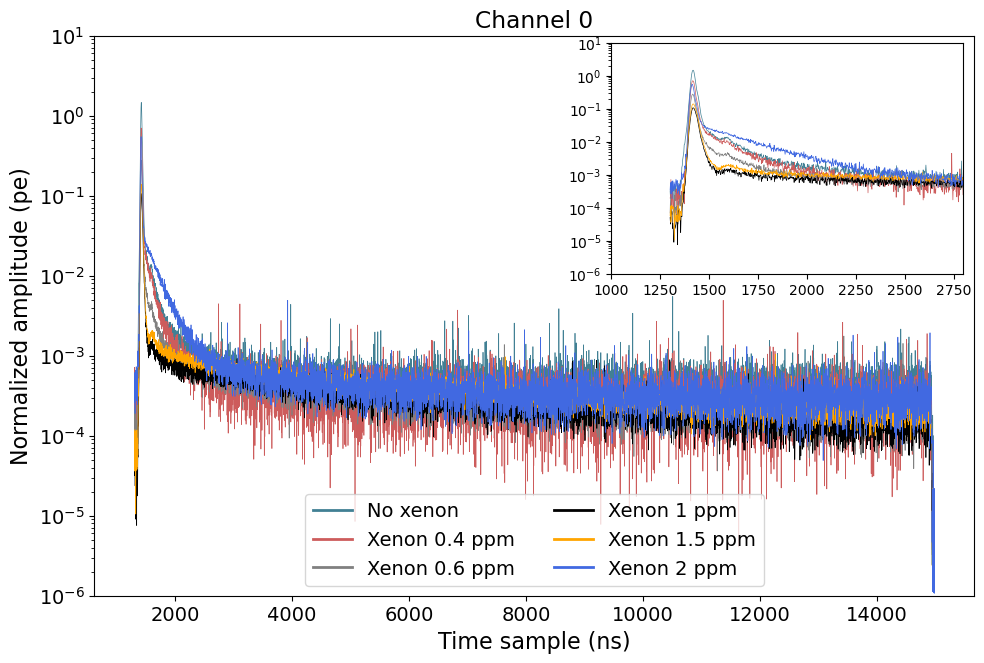

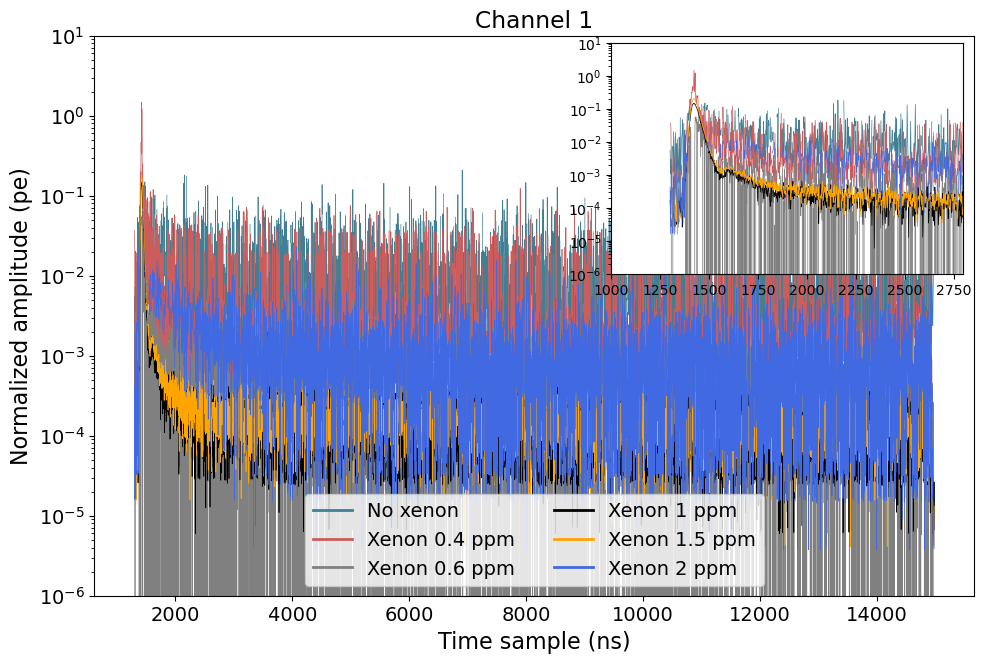

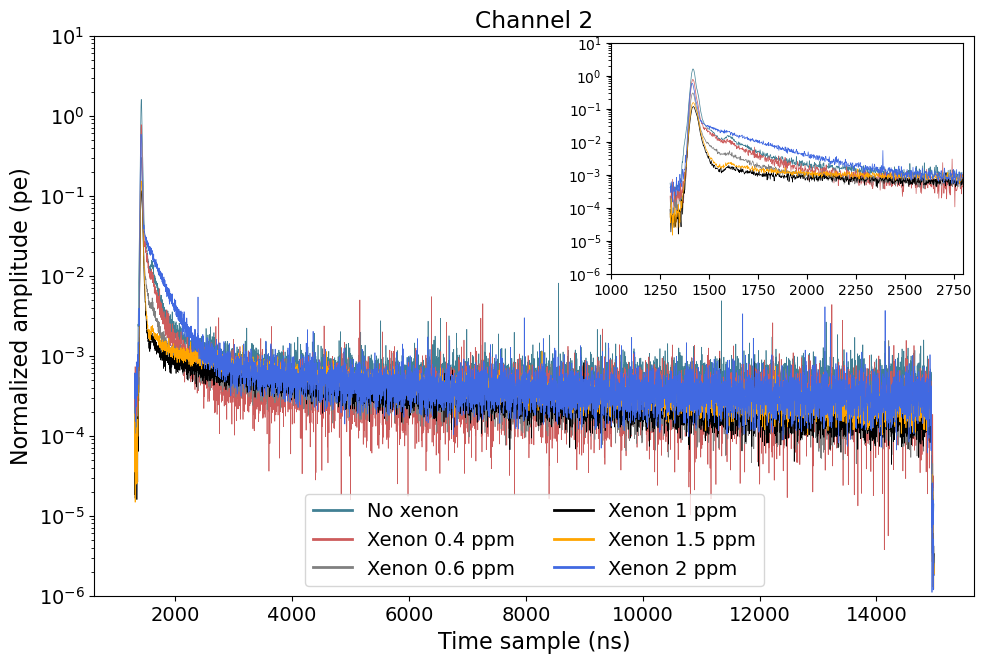

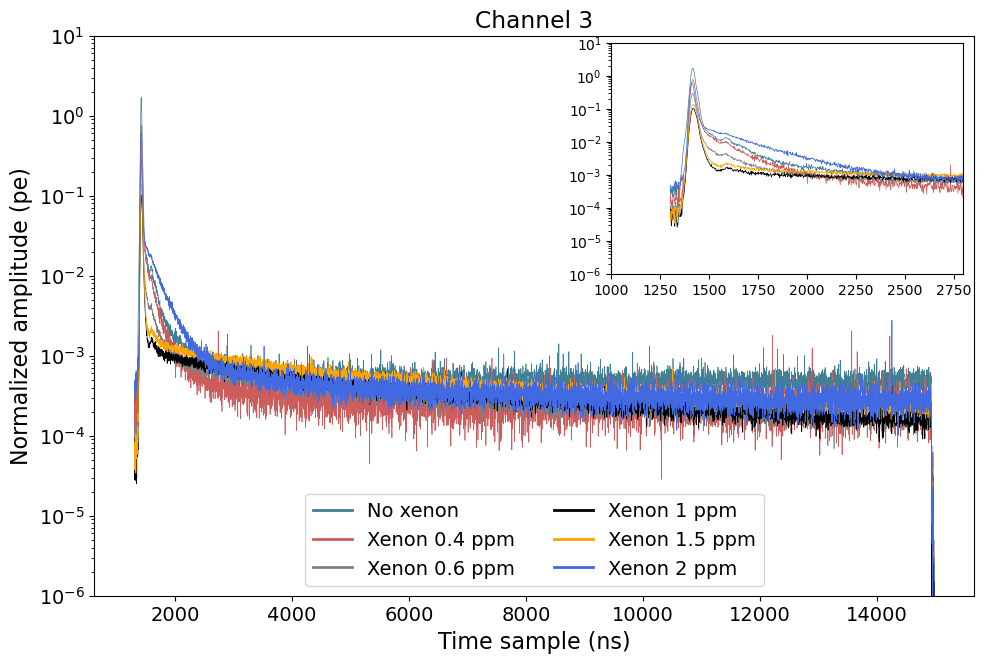

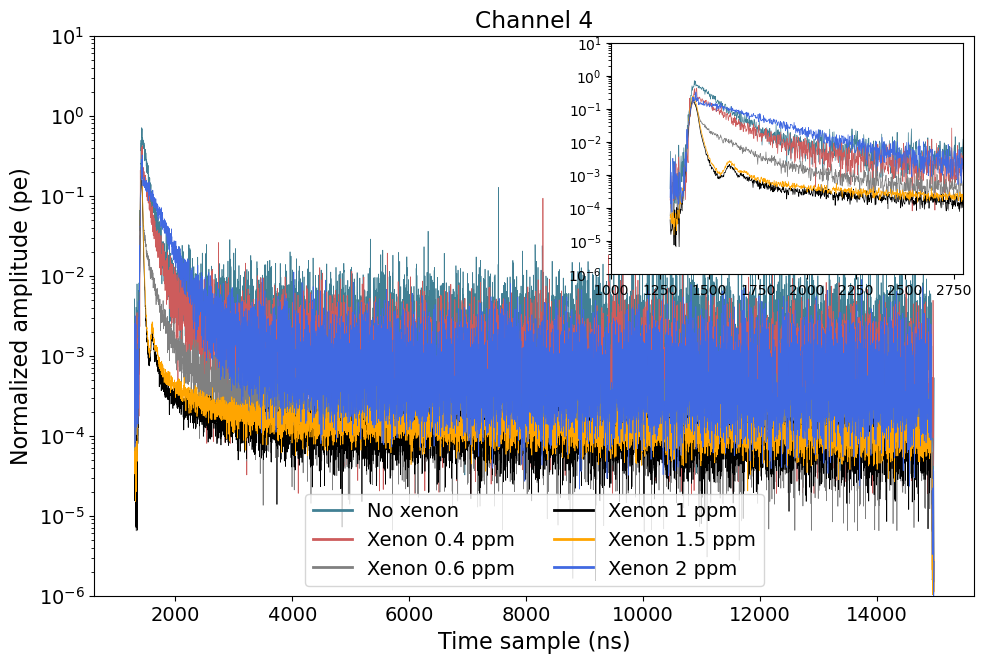

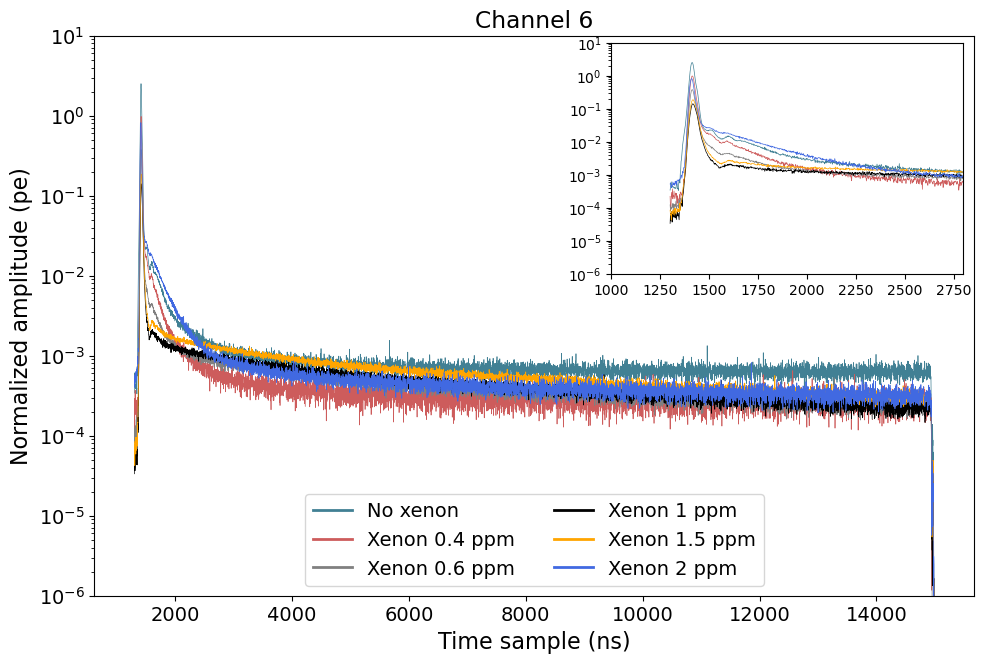

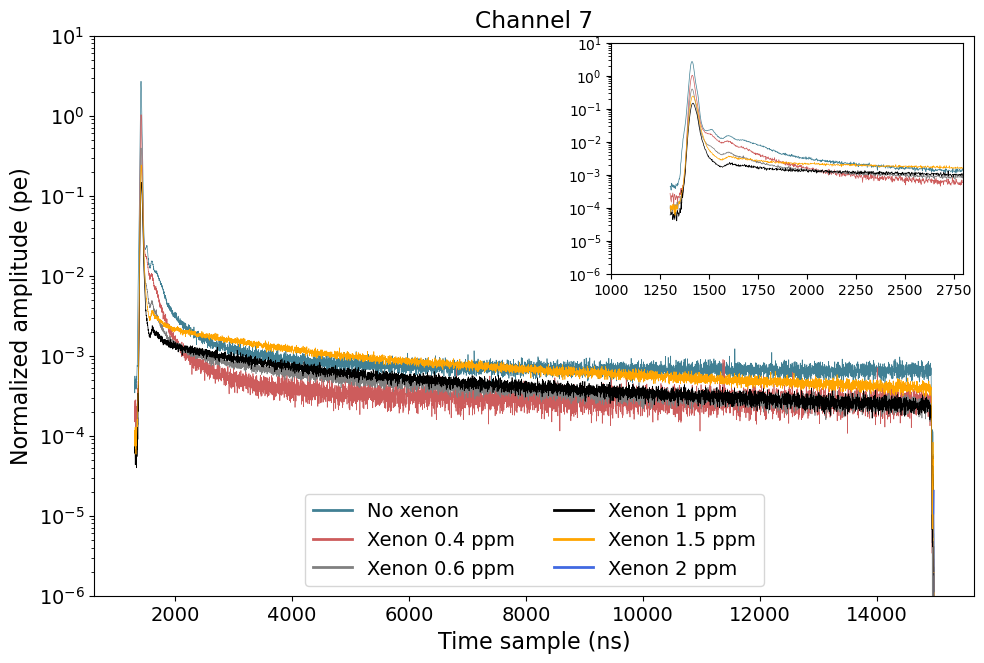

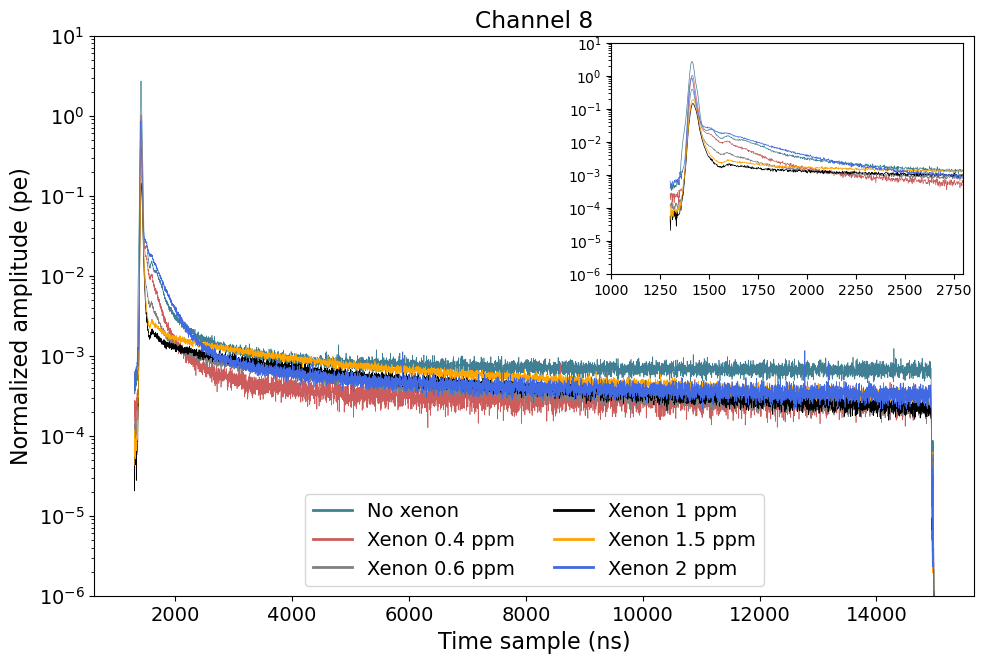

In [195]:
for k in range(9):

    if k==5:
        continue
    #if k!=1:
    #    continue

    fig = plt.figure(figsize=(11, 7))
    ax_main  = fig.add_axes([0.1, 0.1, 0.8, 0.8])  # Main plot axes
    ax_inset = fig.add_axes([0.57, 0.56, 0.32, 0.33])  # Inset plot axes
    
    for sel_dates, title, col in zip([dates_no_doping[1:], dates_xe_doping1, dates_xe_doping2,
                                      dates_xe_doping3, dates_xe_doping4, dates_xe_doping5],
                                     ['No xenon', 'Xenon 0.4 ppm', 'Xenon 0.6 ppm', 'Xenon 1 ppm', 'Xenon 1.5 ppm',
                                      'Xenon 2 ppm'], [fav_col, 'indianred', 'grey', 'k', 'orange', 'royalblue']):
    
        timestamps = 2*np.concatenate([idx_peak_thr_pretrigg_cut[date][k]                                                    for date in sel_dates])
        amplitudes =   np.concatenate([h_peak_sg_d_pretrigg_cut [date][k]/(gains[date][str(k)]*np.sum(num_evts_ch[date][k])) for date in sel_dates])
        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        ax_main .plot(unique_timestamps, sum_amplitudes, lw=0.5, label=title, color=col)
        ax_inset.plot(unique_timestamps, sum_amplitudes, lw=0.5, label=title, color=col)
    
    ax_main.set_xlabel('Time sample (ns)',          fontsize=16)
    ax_main.set_ylabel('Normalized amplitude (pe)', fontsize=16)
    ax_main.set_ylim(1e-6, 1e1)
    ax_main.set_title(f'Channel {k}')
    ax_main.set_yscale('log')
    leg = ax_main.legend(loc='lower center', ncol=2)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    
    ax_inset.set_xlim(1000, 2800)
    ax_inset.set_ylim(1e-6, 1e1)
    ax_inset.tick_params(axis='x', labelsize=10)
    ax_inset.tick_params(axis='y', labelsize=10)
    ax_inset.set_yscale('log')
    
    #plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation/images/hit_map_plot_ch{k}.png', dpi=300, bbox_inches='tight')
    plt.show()

## Trigger SiPMs

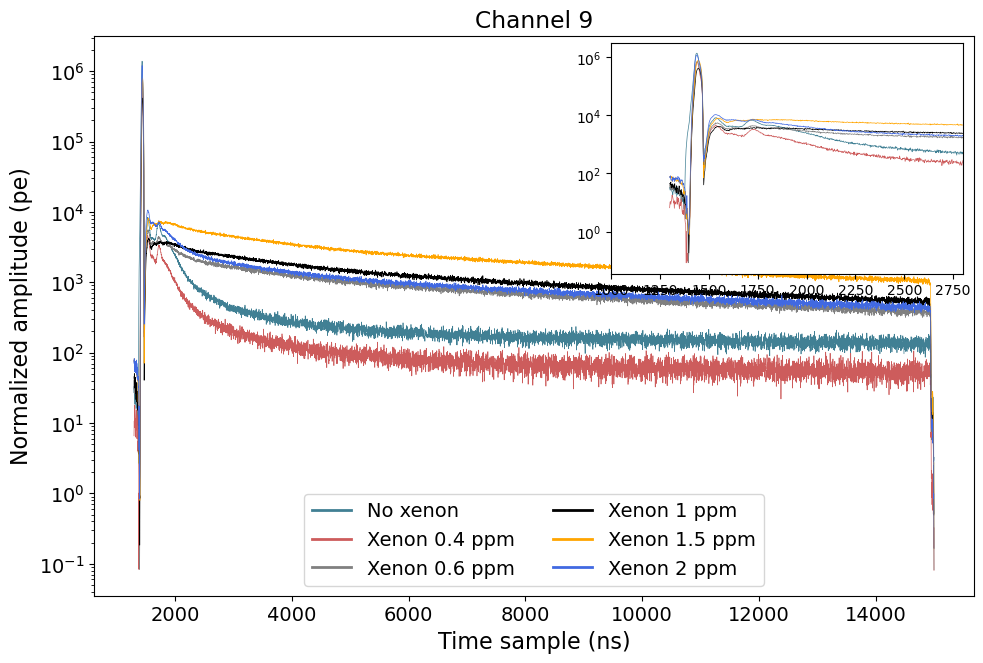

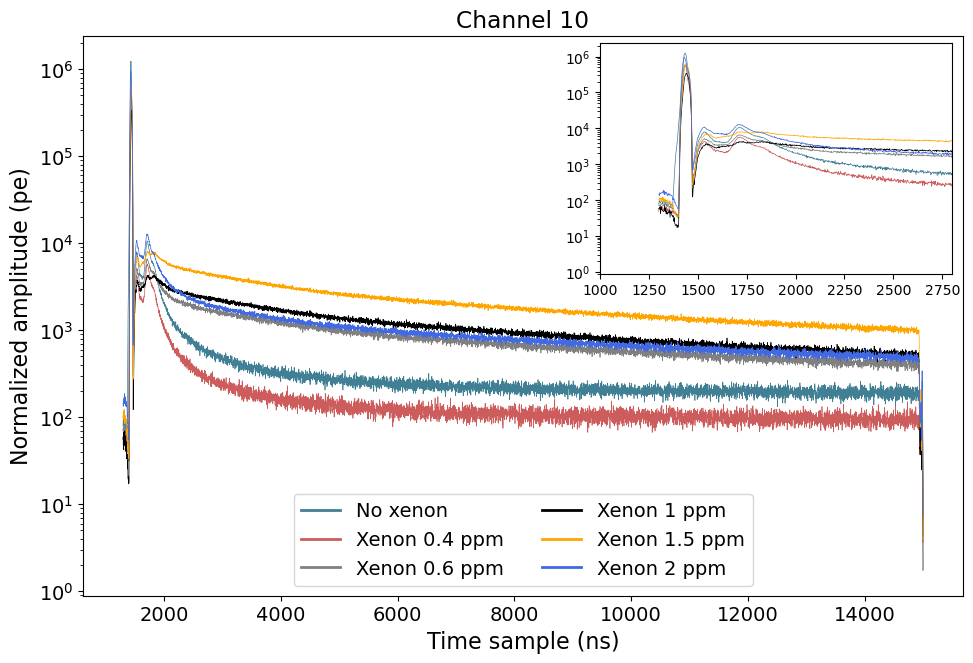

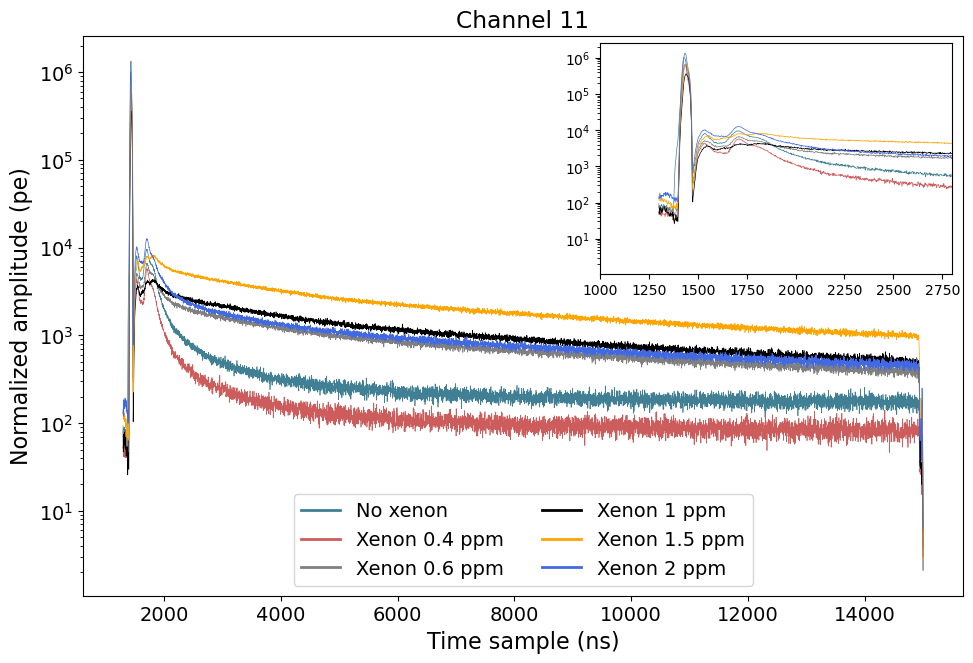

In [194]:
for k in [9, 10, 11]:

    fig = plt.figure(figsize=(11, 7))
    ax_main  = fig.add_axes([0.1, 0.1, 0.8, 0.8])  # Main plot axes
    ax_inset = fig.add_axes([0.57, 0.56, 0.32, 0.33])  # Inset plot axes
    
    for sel_dates, title, col in zip([dates_no_doping[1:], dates_xe_doping1, dates_xe_doping2,
                                      dates_xe_doping3, dates_xe_doping4, dates_xe_doping5],
                                     ['No xenon', 'Xenon 0.4 ppm', 'Xenon 0.6 ppm', 'Xenon 1 ppm', 'Xenon 1.5 ppm',
                                      'Xenon 2 ppm'], [fav_col, 'indianred', 'grey', 'k', 'orange', 'royalblue']):
    
        timestamps = 2*np.concatenate([idx_peak_thr_trigg_pretrigg_cut[date][k]                       for date in sel_dates])
        amplitudes =   np.concatenate([h_peak_sg_d_trigg_pretrigg_cut [date][k]/(gains[date][str(k)]) for date in sel_dates])
        
        unique_timestamps = np.unique(timestamps)
        sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]
    
        ax_main .plot(unique_timestamps, sum_amplitudes, lw=0.5, label=title, color=col)
        ax_inset.plot(unique_timestamps, sum_amplitudes, lw=0.5, label=title, color=col)
    
    ax_main.set_xlabel('Time sample (ns)',          fontsize=16)
    ax_main.set_ylabel('Normalized amplitude (pe)', fontsize=16)
    #ax_main.set_ylim(1e-6, 1e1)
    ax_main.set_title(f'Channel {k}')
    ax_main.set_yscale('log')
    leg = ax_main.legend(loc='lower center', ncol=2)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    
    ax_inset.set_xlim(1000, 2800)
    #ax_inset.set_ylim(1e-6, 1e1)
    ax_inset.tick_params(axis='x', labelsize=10)
    ax_inset.tick_params(axis='y', labelsize=10)
    ax_inset.set_yscale('log')
    
    #plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation/images/hit_map_plot_ch{k}.png', dpi=300, bbox_inches='tight')
    plt.show()

5782224 5782224


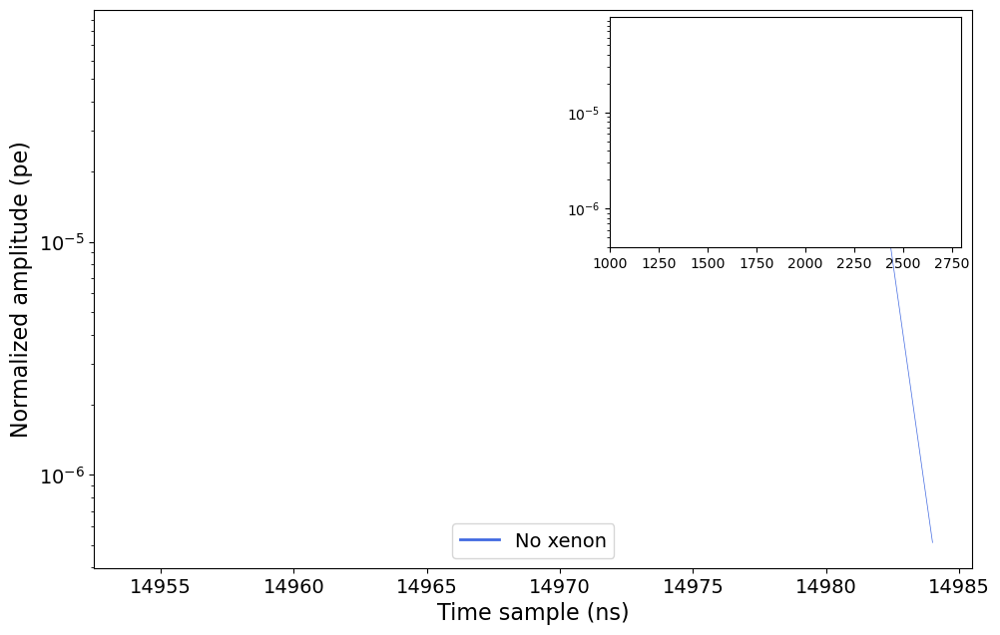

In [201]:
k = 7 ## Channel

fig = plt.figure(figsize=(11, 7))
ax_main  = fig.add_axes([0.1, 0.1, 0.8, 0.8])  # Main plot axes
ax_inset = fig.add_axes([0.57, 0.56, 0.32, 0.33])  # Inset plot axes

for sel_dates, title, col in zip([dates_no_doping[1:], dates_xe_doping1, dates_xe_doping2,
                                  dates_xe_doping3, dates_xe_doping4, dates_xe_doping5][5:],
                                 ['No xenon', 'Xenon 0.4 ppm', 'Xenon 0.6 ppm', 'Xenon 1 ppm', 'Xenon 1.5 ppm',
                                  'Xenon 2 ppm'], [fav_col, 'indianred', 'grey', 'k', 'orange', 'royalblue'][5:]):

    timestamps = 2*np.concatenate([idx_peak_thr_pretrigg_cut[date][k]                                                    for date in sel_dates])
    amplitudes =   np.concatenate([h_peak_sg_d_pretrigg_cut [date][k]/(gains[date][str(k)]*np.sum(num_evts_ch[date][k])) for date in sel_dates])
    
    print(len(timestamps), len(amplitudes))
    unique_timestamps = np.unique(timestamps)
    sum_amplitudes    = [np.sum(amplitudes[timestamps == timestamp]) for timestamp in unique_timestamps]

    ax_main .plot(unique_timestamps, sum_amplitudes, lw=0.5, label=title, color=col)
    ax_inset.plot(unique_timestamps, sum_amplitudes, lw=0.5, label=title, color=col)

ax_main.set_xlabel('Time sample (ns)',          fontsize=16)
ax_main.set_ylabel('Normalized amplitude (pe)', fontsize=16)
#ax_main.set_ylim(1e-6, 1e1)
ax_main.set_yscale('log')
leg = ax_main.legend(loc='lower center', ncol=2)
for line in leg.get_lines():
    line.set_linewidth(2)
    

ax_inset.set_xlim(1000, 2800)
#ax_inset.set_ylim(1e-6, 1e1)
ax_inset.tick_params(axis='x', labelsize=10)
ax_inset.tick_params(axis='y', labelsize=10)
ax_inset.set_yscale('log')

#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation/images/hit_map_plot_ch{k}.png', dpi=300, bbox_inches='tight')
plt.show()